
Use the Machine Learning algorithms: K-NN, Naive Gaussian, and
Decision Tree, and the Raw_aki_patient_data.csv database to evaluate
classification performance with:
1. Exploratory Data Analysis 
2. Parameter optimization 
3. Apply techniques to solve the class imbalance problem present in the database
and evaluate the performance 
4. Discuss the results obtained (different metrics)


I have discussed my results at the end of the notebook

#### Import Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # Data visualisation 
import matplotlib.pyplot as plt # Data visualisation 

# Importing pycaret classification method

from pycaret.classification import *
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.tree        import DecisionTreeClassifier

from sklearn.metrics	 import	accuracy_score
from sklearn.metrics	 import	classification_report
from sklearn.metrics	 import	cohen_kappa_score
from sklearn.metrics	 import	confusion_matrix
from sklearn.metrics	 import	ConfusionMatrixDisplay
from sklearn.metrics	 import	mean_squared_error as MSE
from sklearn.metrics	 import	r2_score
from sklearn.metrics	 import	roc_auc_score
from sklearn.metrics	 import	roc_curve

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.utils import resample

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA


from dtreeviz.trees import *
from collections import Counter

from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE, ADASYN

from statsmodels.formula.api import ols
from statsmodels.api import qqplot

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

from IPython.display import display_html 

from random import sample

from scipy.stats import pearsonr
%matplotlib inline

# To Load the Dataset
import pandas as pd
import numpy as np

# For the Basic Decision Tree
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree

# For the Decision Tree with Parameter Optimization
import time
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# To fix the Confusion Matrix display since plot_confusion_matrix is deprecated
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# To balance the data
from sklearn.utils import resample

# To view images
from IPython.display import Image

#Visualizers
import yellowbrick
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
import matplotlib.pyplot as plt

#Metrics
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import hamming_loss
from sklearn.metrics import log_loss
from sklearn.metrics import zero_one_loss
from sklearn.metrics import matthews_corrcoef

# Import libraries & dependencies
%matplotlib inline
# Data Analysis libraries
import numpy as np
import pandas as pd
# Machine Learning libraries: Data Prep
from sklearn.feature_selection import VarianceThreshold
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
# Machine Learning libraries: Modeling
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, log_loss
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import MultinomialNB
# Data Visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_predict
import scikitplot as skplt
# suppress version deprication warnings
import warnings
warnings.filterwarnings('ignore')

# Basics
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd
import numpy as np
import time

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# Helpers
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
import graphviz
from sklearn.tree import export_graphviz


### Exploratory Data Analysis
#### *Load Dataset*

In [2]:
# Load the dataset
df = pd.read_csv("Raw_aki_patient_data.csv")

df.head() # Display the first five rows of the dataset

,creat,uo_rt_6hr,uo_rt_12hr,uo_rt_24hr,aki_stage,ANIONGAP_min,ANIONGAP_max,ALBUMIN_min,ALBUMIN_max,BANDS_min,BANDS_max,BICARBONATE_min,BICARBONATE_max,BILIRUBIN_min,BILIRUBIN_max,CREATININE_min,CREATININE_max,CHLORIDE_min,CHLORIDE_max,GLUCOSE_min,GLUCOSE_max,HEMATOCRIT_min,HEMATOCRIT_max,HEMOGLOBIN_min,HEMOGLOBIN_max,LACTATE_min,LACTATE_max,PLATELET_min,PLATELET_max,POTASSIUM_min,POTASSIUM_max,PTT_min,PTT_max,INR_min,INR_max,PT_min,PT_max,SODIUM_min,SODIUM_max,BUN_min,BUN_max,WBC_min,WBC_max,HeartRate_Min,HeartRate_Max,HeartRate_Mean,SysBP_Min,SysBP_Max,SysBP_Mean,DiasBP_Min,DiasBP_Max,DiasBP_Mean,MeanBP_Min,MeanBP_Max,MeanBP_Mean,RespRate_Min,RespRate_Max,RespRate_Mean,TempC_Min,TempC_Max,TempC_Mean,SpO2_Min,SpO2_Max,SpO2_Mean,Glucose_Min_1,Glucose_Max_1,Glucose_Mean
0,NaN,1.8030,1.2149,1.2727,0,11.0,14.0,NaN,NaN,NaN,NaN,30.0,32.0,0.3,0.6,0.6,0.8,99.0,106.0,100.0,118.0,20.2,27.7,6.4,8.9,1.0,1.6,431.0,533.0,3.4,4.2,32.6,47.3,2.0,5.6,21.1,48.0,139.0,144.0,12.0,15.0,7.1,11.6,82.0,115.0,93.011429,74.0,144.0,106.331361,33.0,94.0,48.668639,51.333302,110.667,67.889548,8.0,38.0,19.578475,36.722221,39.444444,37.829806,12.0,100.0,98.679558,97.0,123.0,108.500000
1,NaN,0.1437,0.1646,0.1782,3,15.0,20.0,1.9,2.6,8.0,22.0,12.0,21.0,0.3,0.7,1.0,1.6,97.0,105.0,94.0,189.0,25.7,36.8,8.5,12.1,2.1,12.9,41.0,640.0,3.4,4.4,32.3,79.6,1.3,1.9,14.5,20.3,127.0,134.0,15.0,24.0,40.7,56.3,34.0,191.0,116.306122,49.0,137.0,106.650794,34.0,102.0,64.728000,27.000000,220.000,78.516949,12.0,35.0,23.348624,35.722222,38.833333,37.454106,70.0,100.0,93.792683,94.0,243.0,142.714286
2,NaN,1.0916,0.8270,0.7497,0,19.0,27.0,3.0,3.5,NaN,NaN,11.0,19.0,3.4,4.9,1.3,2.0,107.0,111.0,42.0,180.0,31.2,39.3,10.9,13.7,4.8,10.8,47.0,63.0,3.3,3.9,38.0,44.9,3.0,6.2,21.3,30.6,142.0,145.0,21.0,24.0,4.3,8.1,31.0,133.0,119.409091,75.0,159.0,109.756098,39.0,75.0,54.365854,53.000000,91.000,71.350000,15.0,37.0,34.680000,37.444445,38.333333,37.896825,18.0,100.0,90.266667,42.0,270.0,133.769231
3,0.9,NaN,NaN,NaN,1,10.0,24.0,3.2,3.9,NaN,NaN,18.0,30.0,1.0,1.6,0.6,1.6,96.0,108.0,74.0,184.0,21.5,36.0,7.4,11.9,1.1,7.8,262.0,543.0,3.6,7.6,27.2,39.5,1.1,1.9,12.5,20.0,134.0,140.0,13.0,25.0,6.8,19.0,75.0,124.0,100.254237,86.0,165.0,123.777778,23.0,89.0,59.196581,47.000000,106.000,79.355556,11.0,33.0,21.883721,36.111111,39.055557,37.166667,56.0,100.0,96.131579,74.0,208.0,128.380000
4,NaN,15.6182,15.6182,15.6182,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,113.0,113.0,101.0,101.0,31.7,31.7,10.2,10.2,2.2,2.2,79.0,79.0,3.6,3.6,23.7,23.7,1.1,1.1,13.2,13.2,144.0,144.0,34.0,34.0,10.9,10.9,44.0,92.0,80.727273,136.0,136.0,136.000000,66.0,66.0,66.000000,82.000000,82.000,82.000000,6.0,29.0,14.750000,35.722222,35.722222,35.722222,43.0,100.0,94.300000,NaN,NaN,NaN


In [3]:
print(df.shape)

(56093, 67)


In [4]:
# Get a peek of the features
print(list(df.columns))

['creat', 'uo_rt_6hr', 'uo_rt_12hr', 'uo_rt_24hr', 'aki_stage', 'ANIONGAP_min', 'ANIONGAP_max', 'ALBUMIN_min', 'ALBUMIN_max', 'BANDS_min', 'BANDS_max', 'BICARBONATE_min', 'BICARBONATE_max', 'BILIRUBIN_min', 'BILIRUBIN_max', 'CREATININE_min', 'CREATININE_max', 'CHLORIDE_min', 'CHLORIDE_max', 'GLUCOSE_min', 'GLUCOSE_max', 'HEMATOCRIT_min', 'HEMATOCRIT_max', 'HEMOGLOBIN_min', 'HEMOGLOBIN_max', 'LACTATE_min', 'LACTATE_max', 'PLATELET_min', 'PLATELET_max', 'POTASSIUM_min', 'POTASSIUM_max', 'PTT_min', 'PTT_max', 'INR_min', 'INR_max', 'PT_min', 'PT_max', 'SODIUM_min', 'SODIUM_max', 'BUN_min', 'BUN_max', 'WBC_min', 'WBC_max', 'HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean', 'SysBP_Min', 'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max', 'DiasBP_Mean', 'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean', 'RespRate_Min', 'RespRate_Max', 'RespRate_Mean', 'TempC_Min', 'TempC_Max', 'TempC_Mean', 'SpO2_Min', 'SpO2_Max', 'SpO2_Mean', 'Glucose_Min_1', 'Glucose_Max_1', 'Glucose_Mean']


#### *Data Preprocessing*

In [5]:
per_missing = df.isnull().sum()*100/len(df)
per_missing_df = pd.DataFrame(
    {"Feature Name": df.columns,
     "Missing Percentage": per_missing}
)
per_missing_df.sort_values(ascending=False, by="Missing Percentage", inplace=True)
per_missing_df

# This section shows the percentage of missing values per feature(column)
# and helps to decide which features to drop or keep based on the percentage of missing values.

,Feature Name,Missing Percentage
BANDS_min,BANDS_min,81.926444
BANDS_max,BANDS_max,81.926444
uo_rt_12hr,uo_rt_12hr,68.288378
uo_rt_24hr,uo_rt_24hr,68.288378
uo_rt_6hr,uo_rt_6hr,68.288378
...,...,...
HEMATOCRIT_min,HEMATOCRIT_min,0.825415
HeartRate_Max,HeartRate_Max,0.224627
HeartRate_Min,HeartRate_Min,0.224627
HeartRate_Mean,HeartRate_Mean,0.224627


In [6]:
per_missing_df["Missing Percentage"].values

array([81.92644358, 81.92644358, 68.28837823, 68.28837823, 68.28837823,
       51.95122386, 51.95122386, 41.70395593, 41.70395593, 39.77501649,
       39.77501649, 32.9720286 , 12.63080955, 12.63080955, 12.33487244,
       12.33487244, 12.32952418, 12.32952418,  6.91886688,  6.91886688,
        6.91886688,  6.71028471,  6.71028471,  6.71028471,  6.68532615,
        6.68532615,  6.68532615,  6.65501934,  6.65501934,  6.65501934,
        6.65323659,  6.65323659,  6.65323659,  6.64254007,  6.64254007,
        6.64254007,  6.46604746,  6.46604746,  6.46604746,  6.18793789,
        6.18793789,  5.69411513,  5.69411513,  5.69411513,  5.69411513,
        2.41384843,  2.41384843,  2.37106234,  2.37106234,  2.11434582,
        2.11434582,  2.08225625,  2.08225625,  2.03590466,  2.03590466,
        1.04112813,  1.04112813,  1.03221436,  1.03221436,  1.00012479,
        1.00012479,  0.82541494,  0.82541494,  0.22462696,  0.22462696,
        0.22462696,  0.        ])

In [7]:
dftype = pd.DataFrame(df.dtypes, columns=['pd_type']) # Data type of each feature(column)
dftype['n_unique'] = df.nunique() # Number of unique values per feature(column)
dftype['nan_bool'] = df.isna().any() # Boolean indicating presence of NaN values
dftype['n_nan'] = df.isna().sum()  # Number of NaN values
dftype # Display the data types and other info of each feature(column)

,pd_type,n_unique,nan_bool,n_nan
creat,float64,153,True,18495
uo_rt_6hr,float64,11397,True,38305
uo_rt_12hr,float64,11884,True,38305
uo_rt_24hr,float64,12390,True,38305
aki_stage,int64,4,False,0
...,...,...,...,...
SpO2_Max,float64,36,True,3764
SpO2_Mean,float64,29910,True,3764
Glucose_Min_1,float64,376,True,3627
Glucose_Max_1,float64,857,True,3627


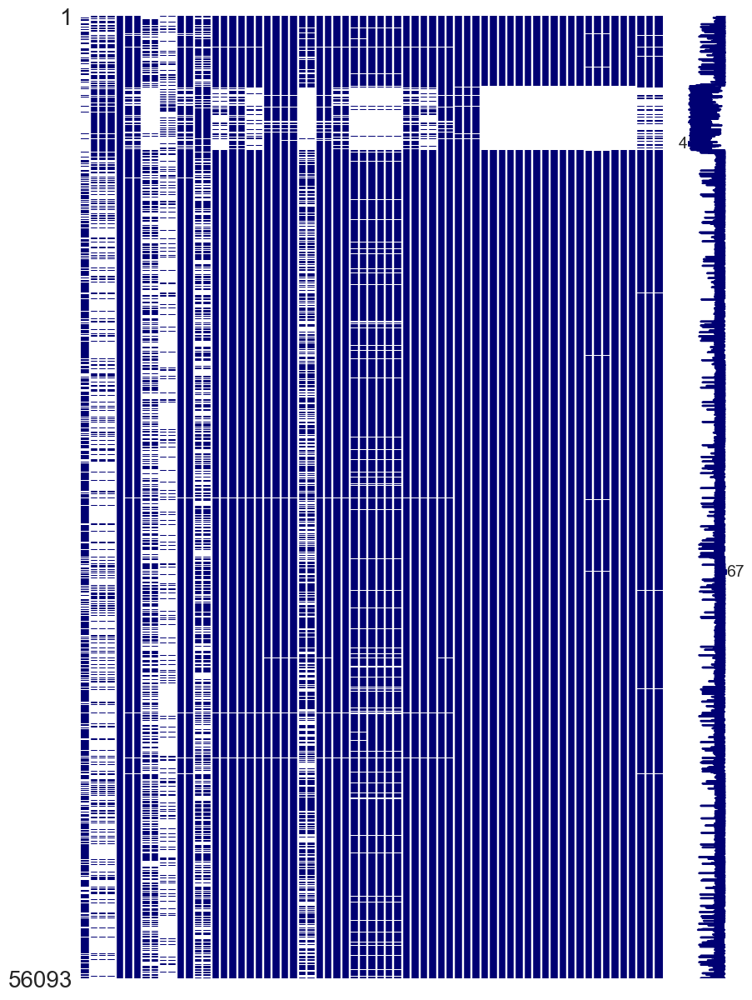

In [8]:
# Visualize missing values as a matrix
import missingno as msno
msno.matrix(df, color=(0., 0., 0.45))   
fig = plt.gcf()
fig.set_size_inches(10, 15)


##### Feature Reduction

In [9]:
# Drop the feature if the missing percenatge is greater than 40 percent
for feature in per_missing_df["Feature Name"].values:
  if per_missing_df.at[feature, "Missing Percentage"] >= 40:
    df.drop([feature], inplace=True, axis=1)
print(df.columns)

Index(['creat', 'aki_stage', 'ANIONGAP_min', 'ANIONGAP_max', 'BICARBONATE_min',
       'BICARBONATE_max', 'CREATININE_min', 'CREATININE_max', 'CHLORIDE_min',
       'CHLORIDE_max', 'GLUCOSE_min', 'GLUCOSE_max', 'HEMATOCRIT_min',
       'HEMATOCRIT_max', 'HEMOGLOBIN_min', 'HEMOGLOBIN_max', 'LACTATE_min',
       'LACTATE_max', 'PLATELET_min', 'PLATELET_max', 'POTASSIUM_min',
       'POTASSIUM_max', 'PTT_min', 'PTT_max', 'INR_min', 'INR_max', 'PT_min',
       'PT_max', 'SODIUM_min', 'SODIUM_max', 'BUN_min', 'BUN_max', 'WBC_min',
       'WBC_max', 'HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean',
       'SysBP_Min', 'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max',
       'DiasBP_Mean', 'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean',
       'RespRate_Min', 'RespRate_Max', 'RespRate_Mean', 'TempC_Min',
       'TempC_Max', 'TempC_Mean', 'SpO2_Min', 'SpO2_Max', 'SpO2_Mean',
       'Glucose_Min_1', 'Glucose_Max_1', 'Glucose_Mean'],
      dtype='object')


In [10]:
df.head()

,creat,aki_stage,ANIONGAP_min,ANIONGAP_max,BICARBONATE_min,BICARBONATE_max,CREATININE_min,CREATININE_max,CHLORIDE_min,CHLORIDE_max,GLUCOSE_min,GLUCOSE_max,HEMATOCRIT_min,HEMATOCRIT_max,HEMOGLOBIN_min,HEMOGLOBIN_max,LACTATE_min,LACTATE_max,PLATELET_min,PLATELET_max,POTASSIUM_min,POTASSIUM_max,PTT_min,PTT_max,INR_min,INR_max,PT_min,PT_max,SODIUM_min,SODIUM_max,BUN_min,BUN_max,WBC_min,WBC_max,HeartRate_Min,HeartRate_Max,HeartRate_Mean,SysBP_Min,SysBP_Max,SysBP_Mean,DiasBP_Min,DiasBP_Max,DiasBP_Mean,MeanBP_Min,MeanBP_Max,MeanBP_Mean,RespRate_Min,RespRate_Max,RespRate_Mean,TempC_Min,TempC_Max,TempC_Mean,SpO2_Min,SpO2_Max,SpO2_Mean,Glucose_Min_1,Glucose_Max_1,Glucose_Mean
0,NaN,0,11.0,14.0,30.0,32.0,0.6,0.8,99.0,106.0,100.0,118.0,20.2,27.7,6.4,8.9,1.0,1.6,431.0,533.0,3.4,4.2,32.6,47.3,2.0,5.6,21.1,48.0,139.0,144.0,12.0,15.0,7.1,11.6,82.0,115.0,93.011429,74.0,144.0,106.331361,33.0,94.0,48.668639,51.333302,110.667,67.889548,8.0,38.0,19.578475,36.722221,39.444444,37.829806,12.0,100.0,98.679558,97.0,123.0,108.500000
1,NaN,3,15.0,20.0,12.0,21.0,1.0,1.6,97.0,105.0,94.0,189.0,25.7,36.8,8.5,12.1,2.1,12.9,41.0,640.0,3.4,4.4,32.3,79.6,1.3,1.9,14.5,20.3,127.0,134.0,15.0,24.0,40.7,56.3,34.0,191.0,116.306122,49.0,137.0,106.650794,34.0,102.0,64.728000,27.000000,220.000,78.516949,12.0,35.0,23.348624,35.722222,38.833333,37.454106,70.0,100.0,93.792683,94.0,243.0,142.714286
2,NaN,0,19.0,27.0,11.0,19.0,1.3,2.0,107.0,111.0,42.0,180.0,31.2,39.3,10.9,13.7,4.8,10.8,47.0,63.0,3.3,3.9,38.0,44.9,3.0,6.2,21.3,30.6,142.0,145.0,21.0,24.0,4.3,8.1,31.0,133.0,119.409091,75.0,159.0,109.756098,39.0,75.0,54.365854,53.000000,91.000,71.350000,15.0,37.0,34.680000,37.444445,38.333333,37.896825,18.0,100.0,90.266667,42.0,270.0,133.769231
3,0.9,1,10.0,24.0,18.0,30.0,0.6,1.6,96.0,108.0,74.0,184.0,21.5,36.0,7.4,11.9,1.1,7.8,262.0,543.0,3.6,7.6,27.2,39.5,1.1,1.9,12.5,20.0,134.0,140.0,13.0,25.0,6.8,19.0,75.0,124.0,100.254237,86.0,165.0,123.777778,23.0,89.0,59.196581,47.000000,106.000,79.355556,11.0,33.0,21.883721,36.111111,39.055557,37.166667,56.0,100.0,96.131579,74.0,208.0,128.380000
4,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,113.0,113.0,101.0,101.0,31.7,31.7,10.2,10.2,2.2,2.2,79.0,79.0,3.6,3.6,23.7,23.7,1.1,1.1,13.2,13.2,144.0,144.0,34.0,34.0,10.9,10.9,44.0,92.0,80.727273,136.0,136.0,136.000000,66.0,66.0,66.000000,82.000000,82.000,82.000000,6.0,29.0,14.750000,35.722222,35.722222,35.722222,43.0,100.0,94.300000,NaN,NaN,NaN


##### Interpolation
We can consider mean values for the missing data points

In [11]:
for feature in df.columns:
  mean_value = df[feature].mean(skipna=True)
  df[feature].fillna(value=mean_value, inplace=True)

df.head()

,creat,aki_stage,ANIONGAP_min,ANIONGAP_max,BICARBONATE_min,BICARBONATE_max,CREATININE_min,CREATININE_max,CHLORIDE_min,CHLORIDE_max,GLUCOSE_min,GLUCOSE_max,HEMATOCRIT_min,HEMATOCRIT_max,HEMOGLOBIN_min,HEMOGLOBIN_max,LACTATE_min,LACTATE_max,PLATELET_min,PLATELET_max,POTASSIUM_min,POTASSIUM_max,PTT_min,PTT_max,INR_min,INR_max,PT_min,PT_max,SODIUM_min,SODIUM_max,BUN_min,BUN_max,WBC_min,WBC_max,HeartRate_Min,HeartRate_Max,HeartRate_Mean,SysBP_Min,SysBP_Max,SysBP_Mean,DiasBP_Min,DiasBP_Max,DiasBP_Mean,MeanBP_Min,MeanBP_Max,MeanBP_Mean,RespRate_Min,RespRate_Max,RespRate_Mean,TempC_Min,TempC_Max,TempC_Mean,SpO2_Min,SpO2_Max,SpO2_Mean,Glucose_Min_1,Glucose_Max_1,Glucose_Mean
0,1.342936,0,11.000000,14.000000,30.000000,32.00000,0.6,0.8,99.0,106.0,100.0,118.0,20.2,27.7,6.4,8.9,1.0,1.6,431.0,533.0,3.4,4.2,32.6,47.3,2.0,5.6,21.1,48.0,139.0,144.0,12.0,15.0,7.1,11.6,82.0,115.0,93.011429,74.0,144.0,106.331361,33.0,94.0,48.668639,51.333302,110.667,67.889548,8.0,38.0,19.578475,36.722221,39.444444,37.829806,12.0,100.0,98.679558,97.000000,123.000000,108.500000
1,1.342936,3,15.000000,20.000000,12.000000,21.00000,1.0,1.6,97.0,105.0,94.0,189.0,25.7,36.8,8.5,12.1,2.1,12.9,41.0,640.0,3.4,4.4,32.3,79.6,1.3,1.9,14.5,20.3,127.0,134.0,15.0,24.0,40.7,56.3,34.0,191.0,116.306122,49.0,137.0,106.650794,34.0,102.0,64.728000,27.000000,220.000,78.516949,12.0,35.0,23.348624,35.722222,38.833333,37.454106,70.0,100.0,93.792683,94.000000,243.000000,142.714286
2,1.342936,0,19.000000,27.000000,11.000000,19.00000,1.3,2.0,107.0,111.0,42.0,180.0,31.2,39.3,10.9,13.7,4.8,10.8,47.0,63.0,3.3,3.9,38.0,44.9,3.0,6.2,21.3,30.6,142.0,145.0,21.0,24.0,4.3,8.1,31.0,133.0,119.409091,75.0,159.0,109.756098,39.0,75.0,54.365854,53.000000,91.000,71.350000,15.0,37.0,34.680000,37.444445,38.333333,37.896825,18.0,100.0,90.266667,42.000000,270.000000,133.769231
3,0.900000,1,10.000000,24.000000,18.000000,30.00000,0.6,1.6,96.0,108.0,74.0,184.0,21.5,36.0,7.4,11.9,1.1,7.8,262.0,543.0,3.6,7.6,27.2,39.5,1.1,1.9,12.5,20.0,134.0,140.0,13.0,25.0,6.8,19.0,75.0,124.0,100.254237,86.0,165.0,123.777778,23.0,89.0,59.196581,47.000000,106.000,79.355556,11.0,33.0,21.883721,36.111111,39.055557,37.166667,56.0,100.0,96.131579,74.000000,208.000000,128.380000
4,1.342936,0,11.226164,16.918395,21.665044,28.04884,1.0,1.0,113.0,113.0,101.0,101.0,31.7,31.7,10.2,10.2,2.2,2.2,79.0,79.0,3.6,3.6,23.7,23.7,1.1,1.1,13.2,13.2,144.0,144.0,34.0,34.0,10.9,10.9,44.0,92.0,80.727273,136.0,136.0,136.000000,66.0,66.0,66.000000,82.000000,82.000,82.000000,6.0,29.0,14.750000,35.722222,35.722222,35.722222,43.0,100.0,94.300000,95.057013,239.531548,137.017814


In [12]:
df.isnull().values.any()

False

In [13]:
df.describe() # summary statistics of the dataset

,creat,aki_stage,ANIONGAP_min,ANIONGAP_max,BICARBONATE_min,BICARBONATE_max,CREATININE_min,CREATININE_max,CHLORIDE_min,CHLORIDE_max,GLUCOSE_min,GLUCOSE_max,HEMATOCRIT_min,HEMATOCRIT_max,HEMOGLOBIN_min,HEMOGLOBIN_max,LACTATE_min,LACTATE_max,PLATELET_min,PLATELET_max,POTASSIUM_min,POTASSIUM_max,PTT_min,PTT_max,INR_min,INR_max,PT_min,PT_max,SODIUM_min,SODIUM_max,BUN_min,BUN_max,WBC_min,WBC_max,HeartRate_Min,HeartRate_Max,HeartRate_Mean,SysBP_Min,SysBP_Max,SysBP_Mean,DiasBP_Min,DiasBP_Max,DiasBP_Mean,MeanBP_Min,MeanBP_Max,MeanBP_Mean,RespRate_Min,RespRate_Max,RespRate_Mean,TempC_Min,TempC_Max,TempC_Mean,SpO2_Min,SpO2_Max,SpO2_Mean,Glucose_Min_1,Glucose_Max_1,Glucose_Mean
count,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000,56093.000000
mean,1.342936,0.310342,11.226164,16.918395,21.665044,28.048840,1.095230,1.753217,99.981574,108.503743,92.711733,199.497248,28.916171,37.258495,9.781047,12.430325,1.582858,3.082942,186.545259,284.403772,3.551126,4.942922,28.975349,50.766684,1.221263,1.831552,13.762850,18.137283,135.075649,142.032493,18.636647,33.616968,8.345025,15.043746,69.153578,114.809422,88.567782,86.839533,158.393671,120.546010,39.672797,92.272097,60.983825,53.863444,116.174724,78.631783,10.910369,30.089372,19.083222,35.852295,37.717340,36.830278,87.983899,99.704848,96.879729,95.057013,239.531548,137.017814
std,1.217599,0.781658,3.105499,4.602545,4.665786,4.568863,1.056676,1.952617,5.693187,5.840850,28.219876,115.800210,7.515259,6.161089,2.551170,2.129197,0.978779,2.166791,102.259069,135.623339,0.522989,0.958555,8.134811,33.808304,0.389038,1.576190,3.026141,10.328105,4.799363,4.473546,14.969945,24.610563,6.156937,11.332641,18.611815,27.929407,19.718539,18.769333,25.587142,15.940512,11.684937,21.423084,10.149296,14.290583,34.186249,10.470523,3.489245,7.441219,3.539276,0.769855,0.809219,0.540202,11.542212,1.077874,2.346509,31.113892,5970.922590,154.523360
min,0.000000,0.000000,1.000000,4.000000,2.000000,5.000000,0.050000,0.100000,1.600000,74.000000,1.000000,11.000000,2.000000,13.000000,1.200000,3.900000,0.050000,0.300000,4.000000,6.000000,0.600000,1.600000,0.150000,16.000000,0.100000,0.600000,2.390000,8.200000,1.210000,97.000000,1.000000,2.000000,0.100000,0.100000,0.146000,30.000000,29.916667,0.150000,45.000000,29.166667,0.320000,25.000000,14.500000,0.200000,23.000000,17.428571,0.170000,8.000000,7.333333,15.000000,30.000000,30.000000,0.500000,42.000000,31.444444,0.106000,1.000000,1.000000
25%,0.800000,0.000000,9.000000,14.000000,19.000000,25.000000,0.600000,0.900000,97.000000,105.000000,79.000000,140.000000,24.000000,33.000000,8.100000,10.900000,1.200000,1.900000,118.000000,199.000000,3.200000,4.300000,25.000000,29.300000,1.100000,1.200000,12.500000,13.600000,133.000000,140.000000,10.000000,17.000000,5.700000,9.900000,58.000000,95.000000,75.791667,77.000000,141.000000,109.477876,33.000000,79.000000,54.283582,48.000000,97.000000,71.611399,9.000000,25.000000,16.644444,35.555556,37.166668,36.518056,87.983899,100.000000,96.129032,78.000000,141.000000,113.757143
50%,1.200000,0.000000,11.000000,16.000000,22.000000,28.000000,0.800000,1.200000,100.000000,108.000000,91.000000,175.000000,27.600000,36.600000,9.300000,12.200000,1.582858,3.082942,173.000000,263.000000,3.500000,4.700000,28.200000,37.700000,1.200000,1.400000,13.400000,15.400000,135.075649,142.000000

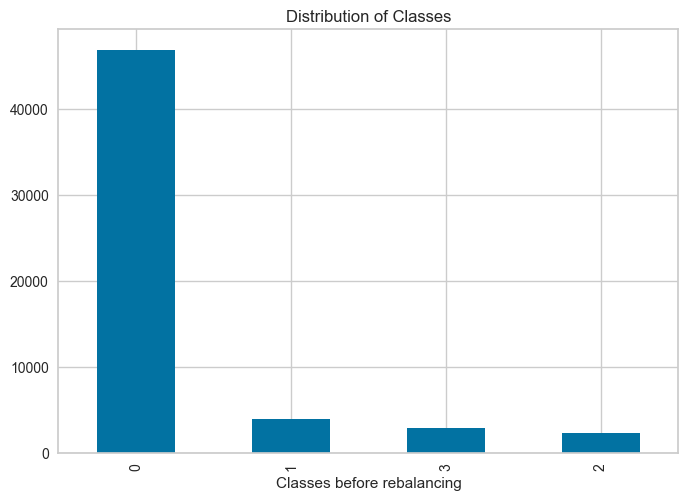

aki_stage
0    46867
1     3995
3     2951
2     2280
Name: count, dtype: int64

In [17]:
# Data Visualization
df["aki_stage"].value_counts().plot.bar()
plt.title("Distribution of Classes")
plt.xlabel("Classes before rebalancing")
plt.show()
# Obtain the class distribution
df.aki_stage.value_counts()


In [18]:
# Separate features (X) and target variable (y)
data_classes = df['aki_stage']
data = df.drop('aki_stage', axis=1)
data_feat = pd.DataFrame(df, columns=[x for x in df.columns])
data_feat.shape

(56093, 58)

In [19]:
# Define dependent (Y) and independent (X) variables for our model F where F(X)=Y
print('\nWe\'ll start by assigning our X and Y values to begin modeling our data.\n')
X = data.copy()
y = data_classes.values

print(f'`X` contains all of the data values as a {X.shape[0]} by {X.shape[1]} data frame.')
print(f'`Y` contains the class labels for each record as a {y.shape[0]} list of values.')


We'll start by assigning our X and Y values to begin modeling our data.

`X` contains all of the data values as a 56093 by 57 data frame.
`Y` contains the class labels for each record as a 56093 list of values.


In [20]:
# Pre-processing variables to check for collinearity
# Machine Learning libraries: Data Prep
from sklearn.feature_selection import VarianceThreshold
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
var_threshold = VarianceThreshold(threshold = 0)
var_threshold.fit(X)
X_cols = X.columns[var_threshold.get_support()]
X = var_threshold.transform(X)
X = pd.DataFrame(X, columns = X_cols)
print('\nConfirming our original data frame has passed all checks, retaining its shape:', X.shape)


Confirming our original data frame has passed all checks, retaining its shape: (56093, 57)


In [21]:
# Select columns which have correlations above specified threshold
import numpy as np
import seaborn as sns

# ensure X is a DataFrame (it should be set earlier)
# set a correlation threshold (e.g. 0.9)
threshold = 0.9

# compute absolute correlation matrix and take the upper triangle
corr_matrix = X.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# identify columns to drop
cols_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
print('\nThere are %d collinear columns to remove.\n' % (len(cols_to_drop)))



There are 3 collinear columns to remove.



In [22]:
# Remove collinear columns from dataset
X = X.drop(cols_to_drop, axis=1)
print(X.shape)

(56093, 54)


In [23]:
# Making optimized data copies for passing through different training sets later in this report
X_copy = X.copy()
y_copy = y.copy()

### *PCA of Unbalanced & Balanced Data*
#### Unbalanced

In [48]:
print(X_copy.shape, "\n", y.shape)

(56093, 54) 
 (56093,)


In [49]:
# Train test split of unbalanced data
# 30% would be a good percentage for testing our model
X_train_un, X_test_un, y_train_un, y_test_un = train_test_split(X_copy, y_copy, test_size=0.3, shuffle=True, random_state=2021)
print(X_train_un.shape, X_test_un.shape, y_train_un.shape, y_test_un.shape)

(39265, 54) (16828, 54) (39265,) (16828,)


In [50]:
#standardize the data
# Train Data Scaler
from sklearn import preprocessing


train_scaler_un = preprocessing.StandardScaler().fit(X_train_un)
# mean, scale
print("means:", "\n", train_scaler_un.mean_)
print("scales:", "\n", train_scaler_un.scale_)

# Transform the training data (apply standardization) and keep as DataFrame with same columns/index
X_train_un = pd.DataFrame(train_scaler_un.transform(X_train_un), columns=X_train_un.columns, index=X_train_un.index)

means: 
 [  1.34391043  11.22378071  16.92689872  21.66574977  28.065524
   1.09631248   1.75567403  99.98161893 108.48390457  92.7227718
 199.97524652  28.90249825  37.23230679   1.58421185   3.08485886
 186.9199001  285.33005195   3.55043876   4.94157084  28.93524549
  50.65677788   1.21941136   1.83410483  13.75456108  18.14085735
 135.08407555 142.03730714  18.63823652  33.59767399   8.3481444
  15.02873451  69.1916561  114.86481539  88.62587038  86.8718931
 158.43986502 120.59016013  39.65136929  92.33978426  61.03661871
  53.8604473  116.2523934   78.68021349  10.90737722  30.13475271
  19.09851044  35.84995549  37.71748046  36.82907571  88.02368746
  99.70241833  96.87732342  95.08032468 229.55995834]
scales: 
 [1.22521648e+00 3.11097394e+00 4.59600622e+00 4.66302553e+00
 4.58772999e+00 1.06355215e+00 1.99928022e+00 5.69018201e+00
 5.84103881e+00 2.82578624e+01 1.16481953e+02 7.48265746e+00
 6.13370517e+00 9.88816111e-01 2.19259437e+00 1.02693124e+02
 1.36623332e+02 5.23957210e-

In [51]:
print(X_train_un.std(axis=0))

creat              1.000013
ANIONGAP_min       1.000013
ANIONGAP_max       1.000013
BICARBONATE_min    1.000013
BICARBONATE_max    1.000013
CREATININE_min     1.000013
CREATININE_max     1.000013
CHLORIDE_min       1.000013
CHLORIDE_max       1.000013
GLUCOSE_min        1.000013
GLUCOSE_max        1.000013
HEMATOCRIT_min     1.000013
HEMATOCRIT_max     1.000013
LACTATE_min        1.000013
LACTATE_max        1.000013
PLATELET_min       1.000013
PLATELET_max       1.000013
POTASSIUM_min      1.000013
POTASSIUM_max      1.000013
PTT_min            1.000013
PTT_max            1.000013
INR_min            1.000013
INR_max            1.000013
PT_min             1.000013
PT_max             1.000013
SODIUM_min         1.000013
SODIUM_max         1.000013
BUN_min            1.000013
BUN_max            1.000013
WBC_min            1.000013
WBC_max            1.000013
HeartRate_Min      1.000013
HeartRate_Max      1.000013
HeartRate_Mean     1.000013
SysBP_Min          1.000013
SysBP_Max          1

In [52]:
# Verify standardization: training data should have mean ~0 and std ~1
print("Training data column means (approx):\n", X_train_un.mean(axis=0).round(6))
print("Training data column stds (approx):\n", X_train_un.std(axis=0).round(6))

# Also show scaler reported mean and scale for cross-check
print('\nScaler mean_ (first 10):', train_scaler_un.mean_[:10].round(6))
print('Scaler scale_ (first 10):', train_scaler_un.scale_[:10].round(6))

Training data column means (approx):
 creat             -0.0
ANIONGAP_min      -0.0
ANIONGAP_max      -0.0
BICARBONATE_min   -0.0
BICARBONATE_max    0.0
CREATININE_min    -0.0
CREATININE_max     0.0
CHLORIDE_min      -0.0
CHLORIDE_max      -0.0
GLUCOSE_min        0.0
GLUCOSE_max       -0.0
HEMATOCRIT_min     0.0
HEMATOCRIT_max     0.0
LACTATE_min        0.0
LACTATE_max        0.0
PLATELET_min       0.0
PLATELET_max      -0.0
POTASSIUM_min      0.0
POTASSIUM_max     -0.0
PTT_min            0.0
PTT_max            0.0
INR_min           -0.0
INR_max           -0.0
PT_min             0.0
PT_max            -0.0
SODIUM_min        -0.0
SODIUM_max         0.0
BUN_min           -0.0
BUN_max            0.0
WBC_min            0.0
WBC_max           -0.0
HeartRate_Min      0.0
HeartRate_Max     -0.0
HeartRate_Mean    -0.0
SysBP_Min         -0.0
SysBP_Max         -0.0
SysBP_Mean         0.0
DiasBP_Min        -0.0
DiasBP_Max         0.0
DiasBP_Mean       -0.0
MeanBP_Min        -0.0
MeanBP_Max         

In [53]:
# Use the training scaler to transform the test set (do not fit on test)
# Fit was already done on training data; now transform the test set
# preserve the original index (and optionally columns) before transform

# Safely capture index if X_test_un is a DataFrame; otherwise use default RangeIndex
if hasattr(X_test_un, "index"):
	_test_index = X_test_un.index
else:
	_test_index = None

# Use columns from the scaled training DataFrame if available
_cols = getattr(X_train_un, "columns", None)

# Transform the test set (this returns a numpy array)
X_test_un_scaled = train_scaler_un.transform(X_test_un)

# Convert back to DataFrame preserving columns and index if available
X_test_un = pd.DataFrame(X_test_un_scaled, columns=_cols, index=_test_index)

PCA of Unbalanced Dataset

In [54]:
time_start = time.time()

pca = PCA(n_components=4)
pca_result = pca.fit_transform(X_test_un)

print("PCA done! Time elapsed {} seconds".format(time.time() - time_start))

PCA done! Time elapsed 0.07470440864562988 seconds


In [55]:
# Check the PCA components
pca_df_un = pd.DataFrame(columns=["PCA1", "PCA2", "PCA3", "PCA4"])

for i in range(4):
  pca_df_un["PCA{}".format(i+1)] = pca_result[:, i]

print("Variance explained per principle component: {}".format(pca.explained_variance_ratio_))
print(pca_df_un)

Variance explained per principle component: [0.11207685 0.07769152 0.07198869 0.06394334]
         PCA1      PCA2      PCA3      PCA4  
0     -1.267914 -1.644263 -3.152372 -0.755067
1      0.660486  2.584612 -1.102035 -1.772463
2     -1.819160  2.476821 -0.326386 -1.728894
3      3.010990  0.018716 -3.105492 -0.494962
4     -2.131718  1.854083  0.149115 -0.157679
...         ...       ...       ...       ...
16823  1.818894 -5.409634 -1.045275 -4.773773
16824 -0.063278 -2.325281 -0.567609 -0.583794
16825 -0.991507  0.529525  2.307214 -1.096194
16826 -0.392903 -1.635631 -2.182311 -0.152824
16827 -1.135642 -2.580863  0.804969 -1.413199

[16828 rows x 4 columns]


In [63]:
print(df.columns)
print(df["aki_stage"].dtype)
print(df["aki_stage"].value_counts())

Index(['creat', 'aki_stage', 'ANIONGAP_min', 'ANIONGAP_max', 'BICARBONATE_min',
       'BICARBONATE_max', 'CREATININE_min', 'CREATININE_max', 'CHLORIDE_min',
       'CHLORIDE_max', 'GLUCOSE_min', 'GLUCOSE_max', 'HEMATOCRIT_min',
       'HEMATOCRIT_max', 'HEMOGLOBIN_min', 'HEMOGLOBIN_max', 'LACTATE_min',
       'LACTATE_max', 'PLATELET_min', 'PLATELET_max', 'POTASSIUM_min',
       'POTASSIUM_max', 'PTT_min', 'PTT_max', 'INR_min', 'INR_max', 'PT_min',
       'PT_max', 'SODIUM_min', 'SODIUM_max', 'BUN_min', 'BUN_max', 'WBC_min',
       'WBC_max', 'HeartRate_Min', 'HeartRate_Max', 'HeartRate_Mean',
       'SysBP_Min', 'SysBP_Max', 'SysBP_Mean', 'DiasBP_Min', 'DiasBP_Max',
       'DiasBP_Mean', 'MeanBP_Min', 'MeanBP_Max', 'MeanBP_Mean',
       'RespRate_Min', 'RespRate_Max', 'RespRate_Mean', 'TempC_Min',
       'TempC_Max', 'TempC_Mean', 'SpO2_Min', 'SpO2_Max', 'SpO2_Mean',
       'Glucose_Min_1', 'Glucose_Max_1', 'Glucose_Mean'],
      dtype='object')
int64
aki_stage
0    46867
1     3995


Shape of your Data Set loaded: (16828, 5)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    4 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################
To fix these data quality

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
PCA1,float64,0.000000,NA,-7.996024,38.082281,Column has 770 outliers greater than upper bound (4.77) or lower than lower bound(-5.34). Cap them or remove them.
PCA2,float64,0.000000,NA,-14.364944,17.185079,Column has 138 outliers greater than upper bound (5.87) or lower than lower bound(-5.78). Cap them or remove them.
PCA3,float64,0.000000,NA,-6.599719,23.015616,Column has 175 outliers greater than upper bound (5.23) or lower than lower bound(-5.40). Cap them or remove them.
PCA4,float64,0.000000,NA,-11.222646,12.315121,Column has 954 outliers greater than upper bound (3.94) or lower than lower bound(-3.93). Cap them or remove them.
aki_stage,int64,0.000000,0,0.000000,3.000000,Target column. Appears to have Imbalanced classes. Try balancing classes.


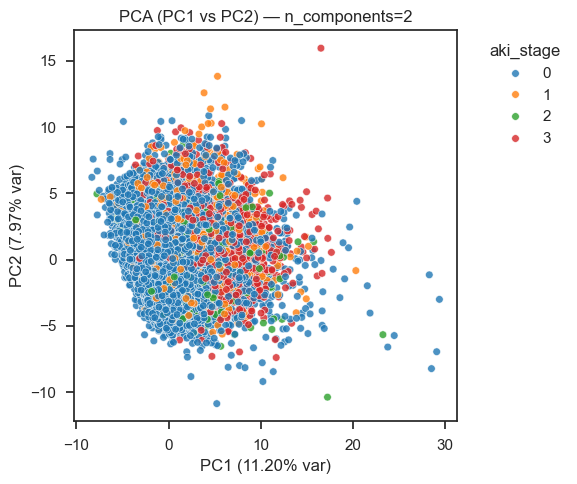

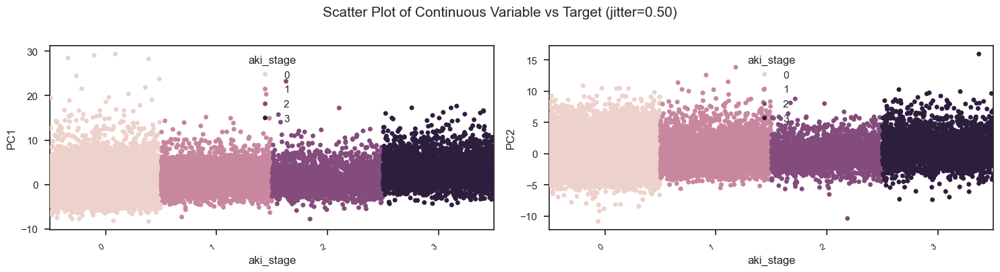

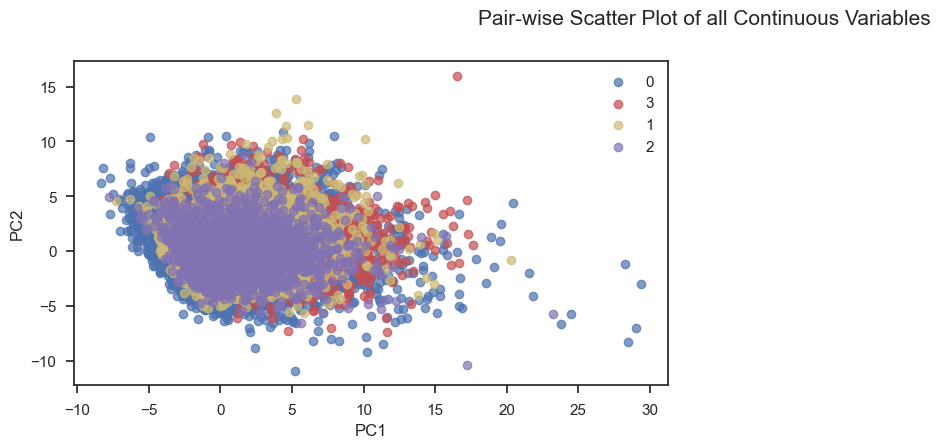

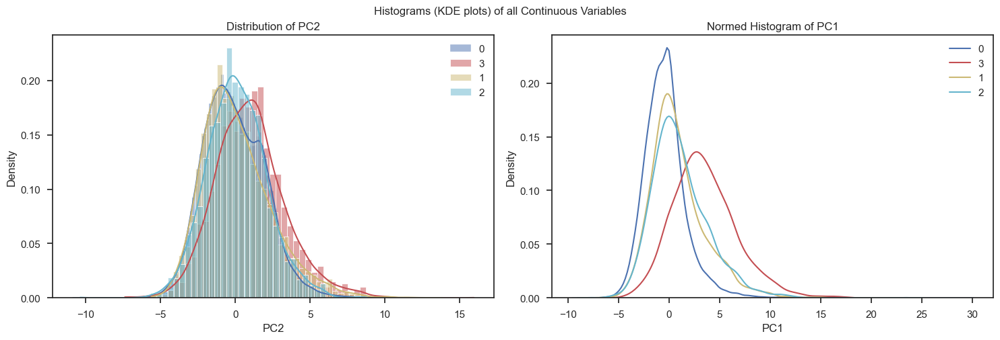

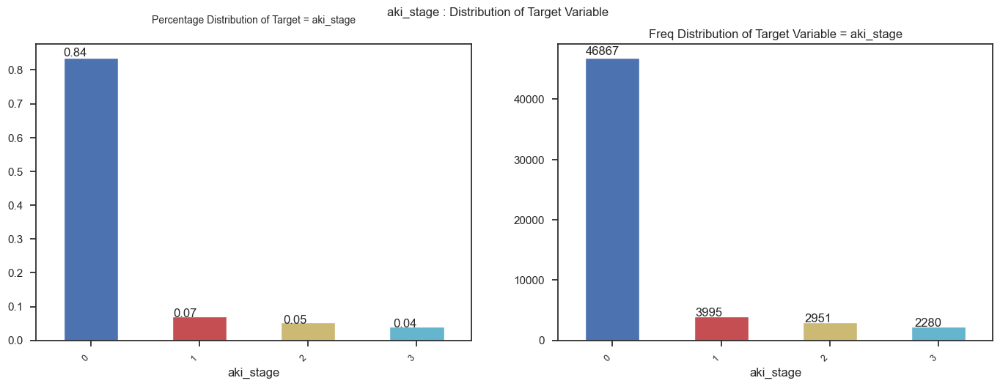

...

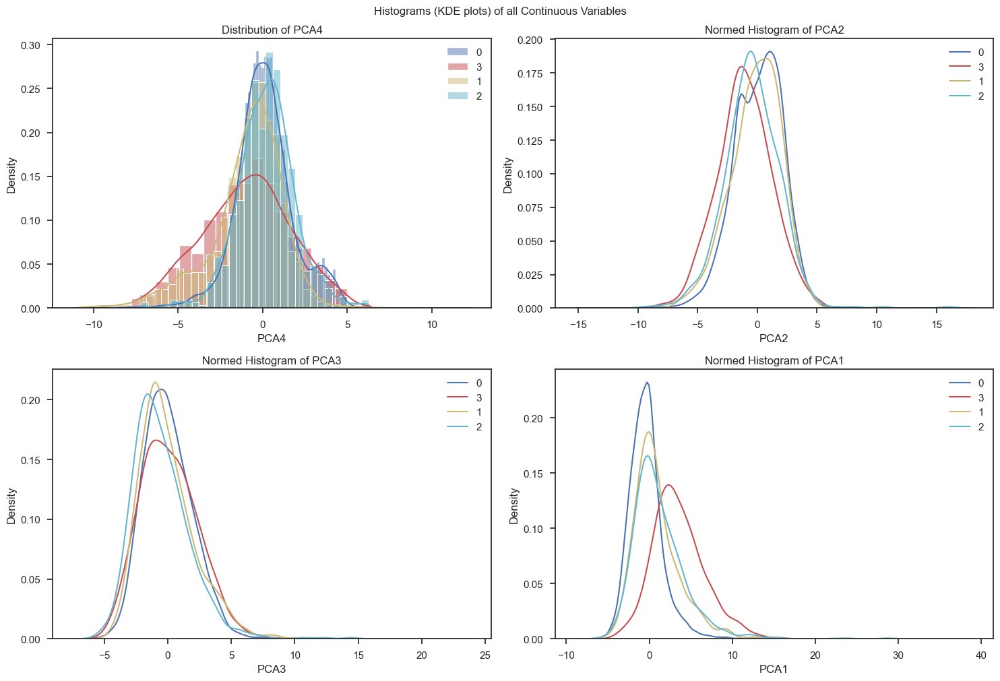

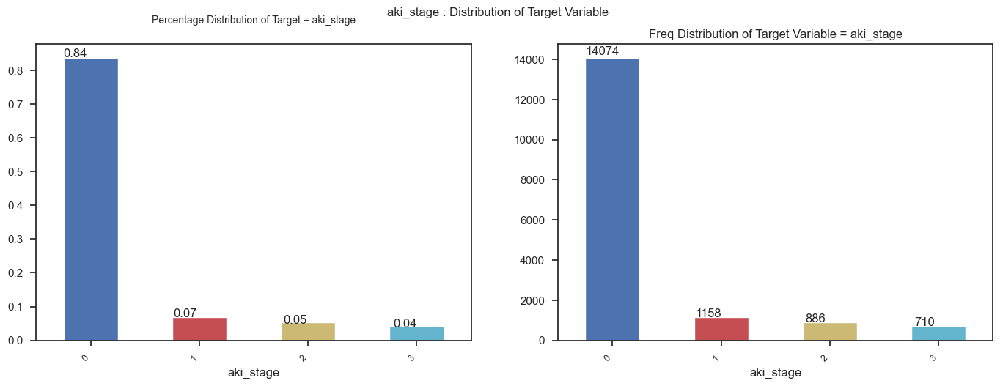

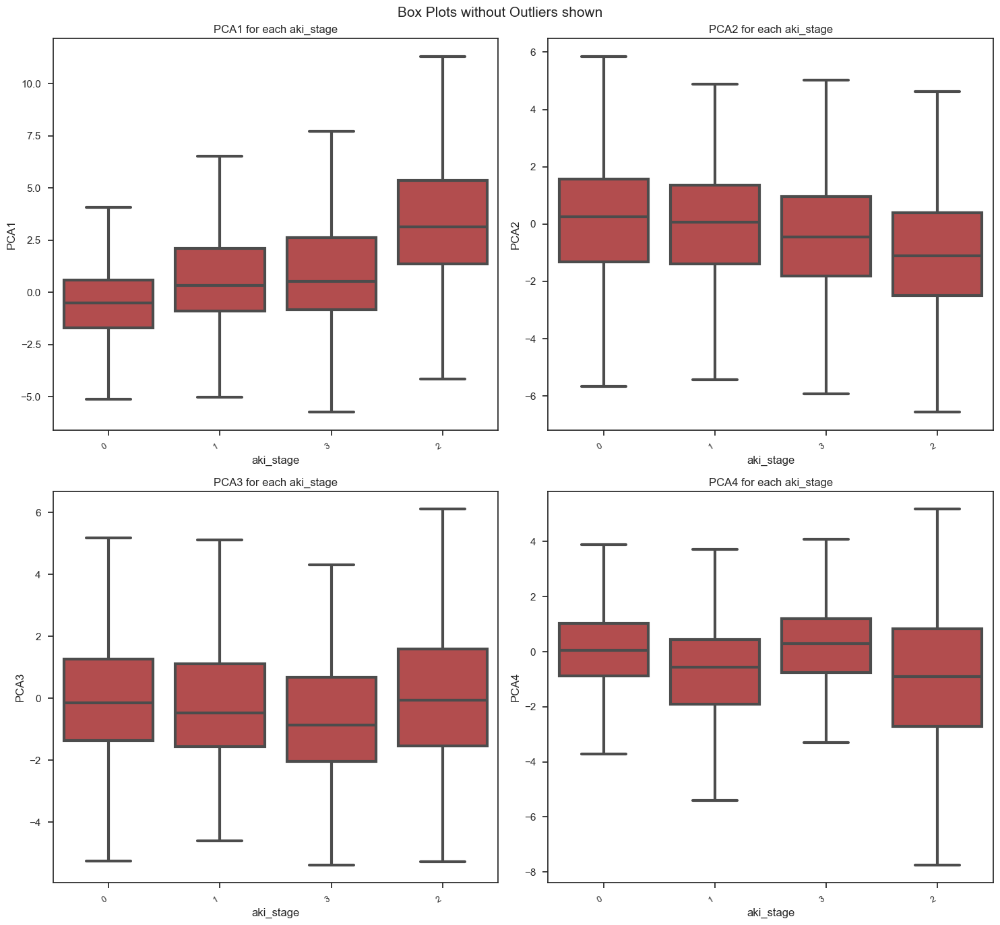

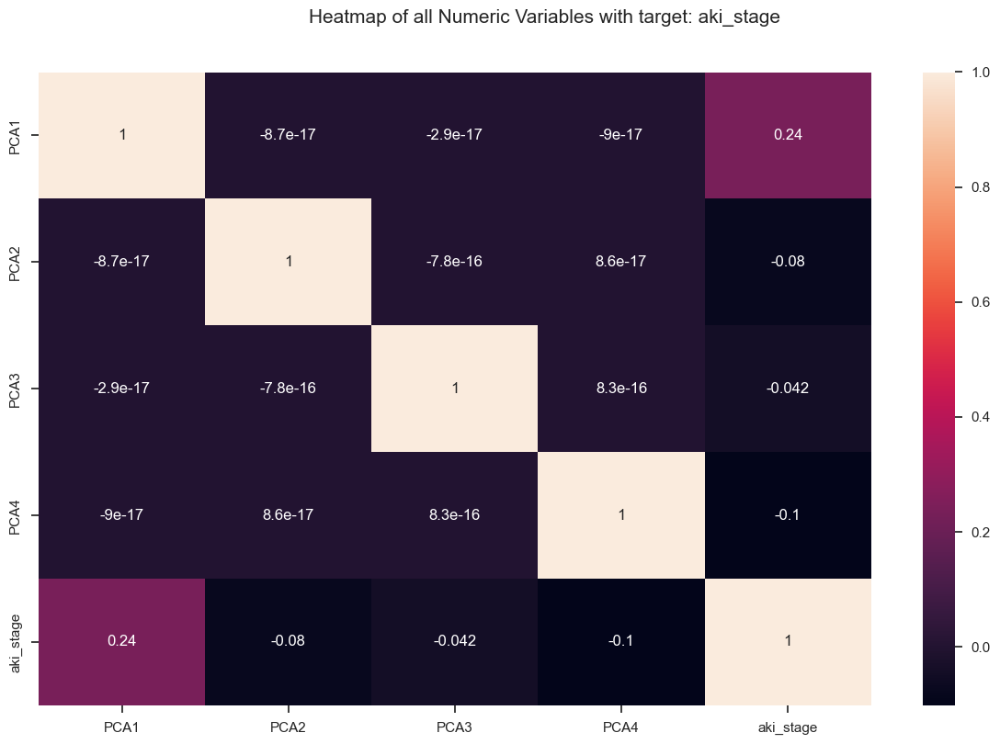

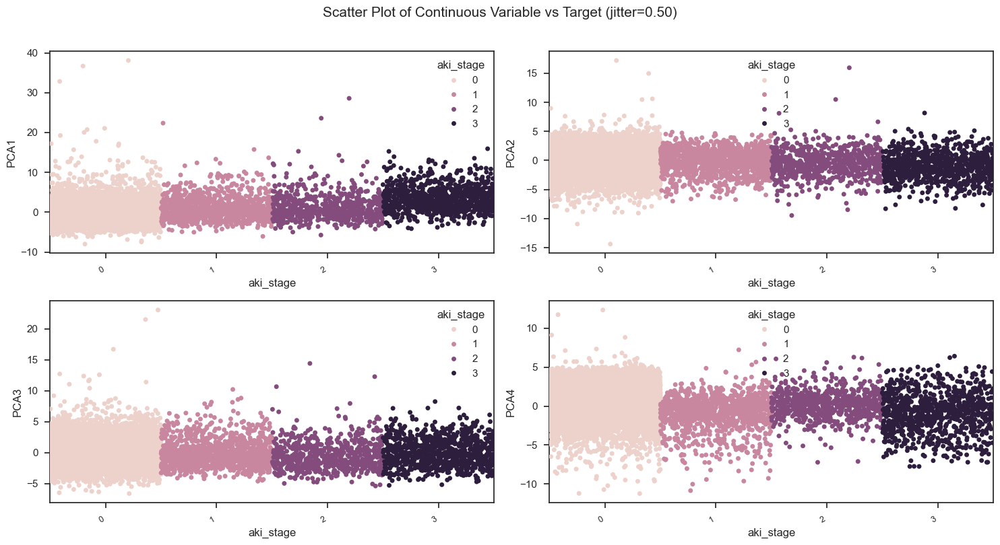

Total Number of Scatter Plots = 10


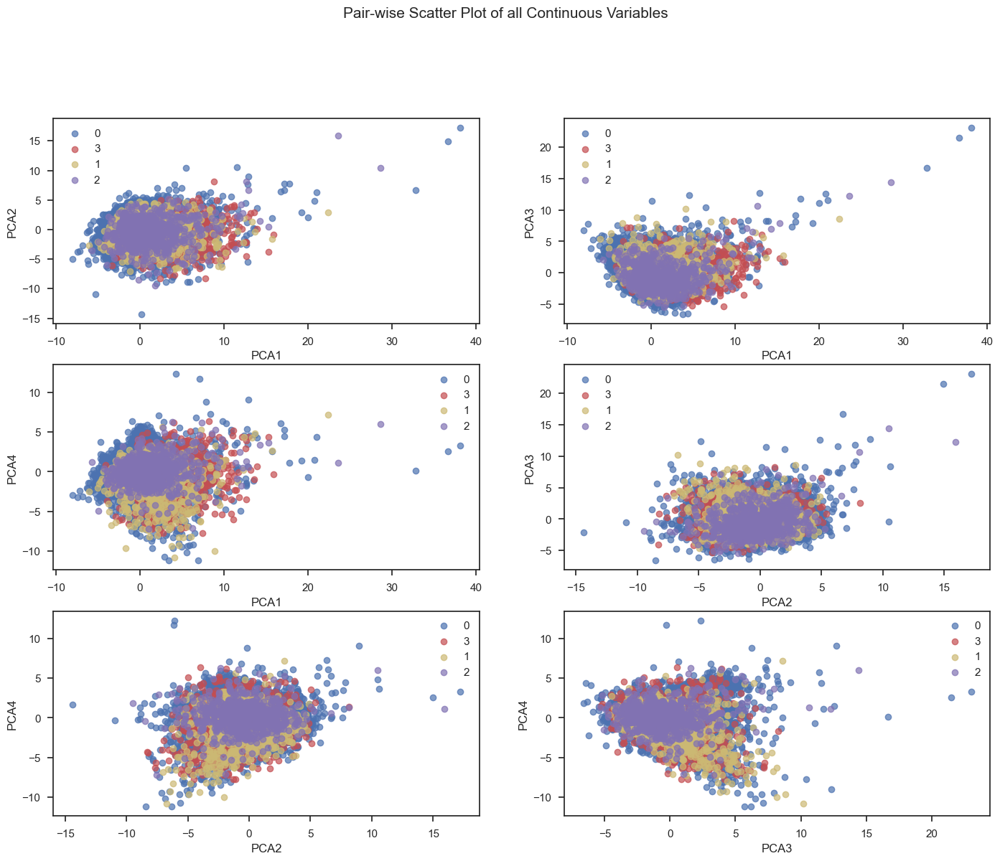

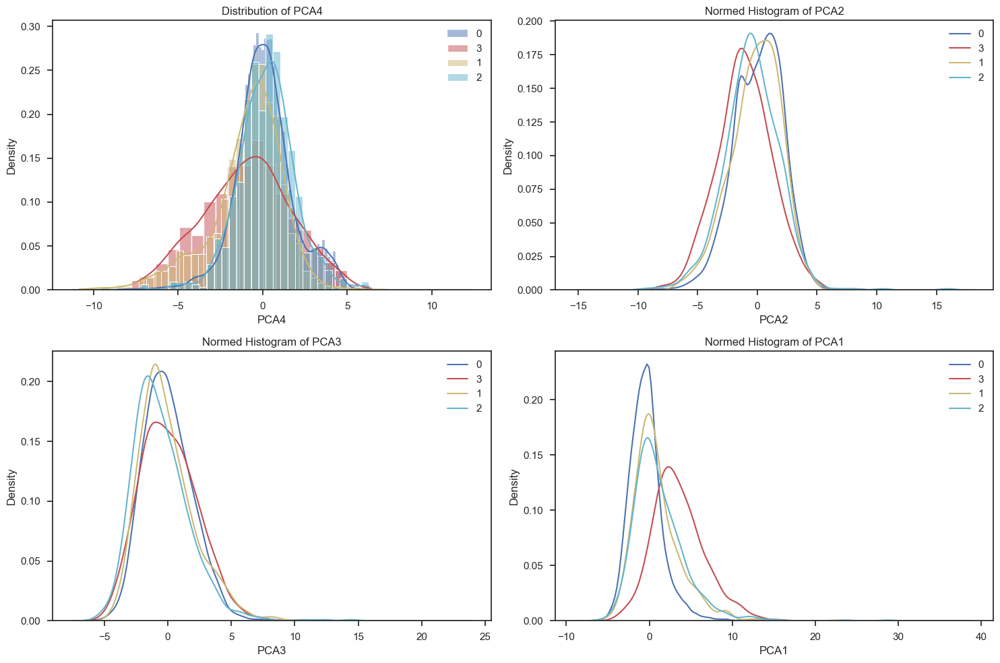

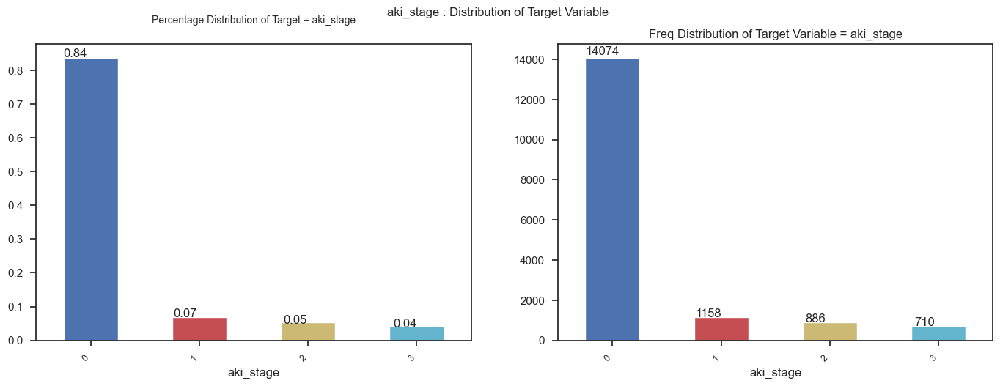

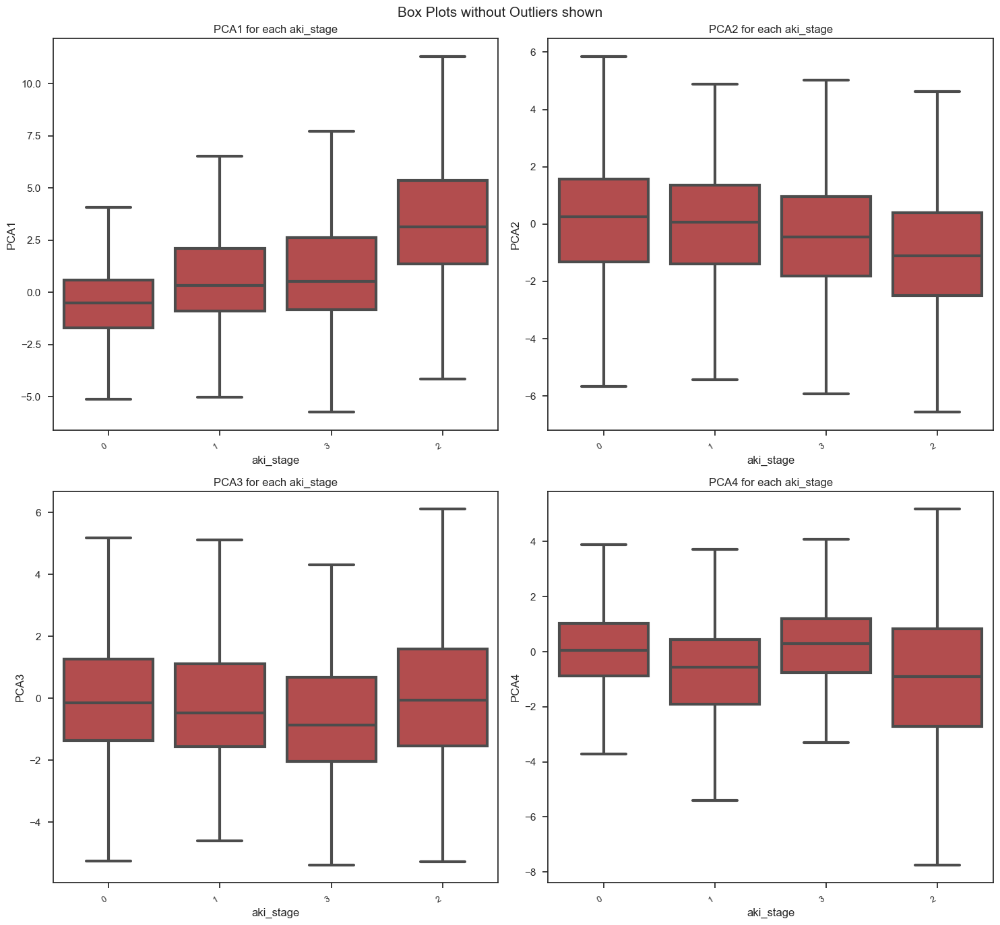

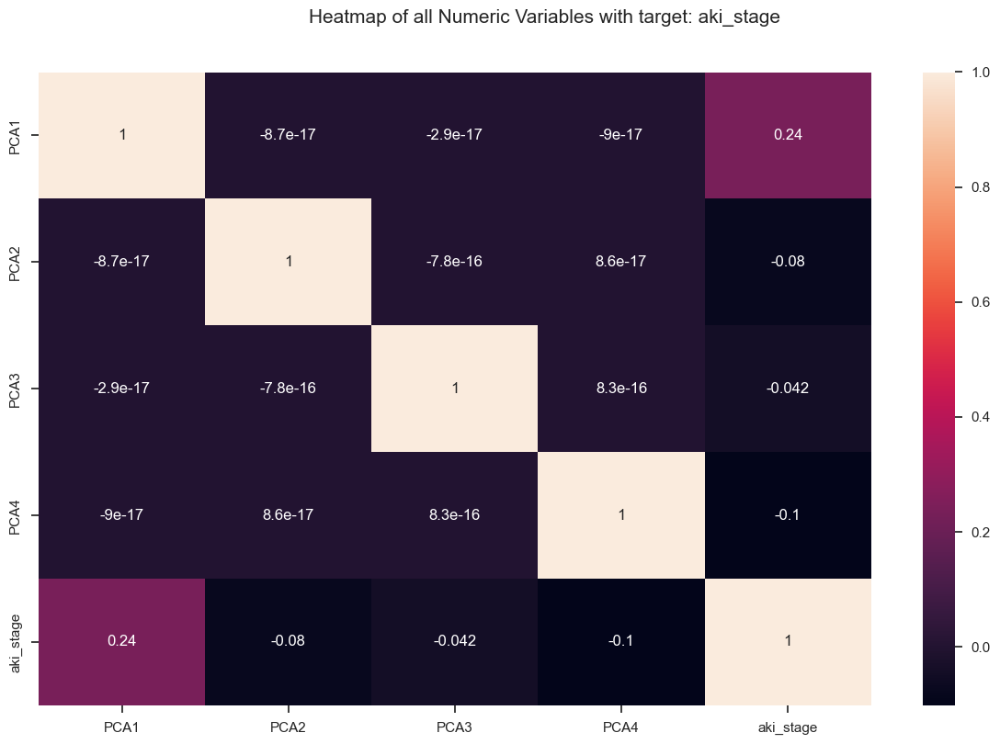

All Plots done
Time to run AutoViz = 29 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [65]:
# Visualize the unbalanced data after PCA transformation
pca_df = pca_df_un.reset_index(drop=True)
df_y = pd.Series(y_test_un, name="aki_stage").reset_index(drop=True)
df_av = pd.concat([pca_df, df_y], axis=1)
%matplotlib inline
from autoviz import AutoViz_Class
AV = AutoViz_Class()
dft = AV.AutoViz(df_av, depVar="aki_stage", save_plot_dir=r"d:\Users\.virtualenvs\.virtualenvs\new_env\ai311\UHD\DM")

#### PCA of Balanced Dataset 

### *Balance*
I am going to be using the SMOTE method to balance the dataset

Class distribution BEFORE SMOTE:
 0    46867
1     3995
2     2280
3     2951
Name: count, dtype: int64

Class distribution AFTER SMOTE:
 0    46867
1    46867
2    46867
3    46867
Name: count, dtype: int64


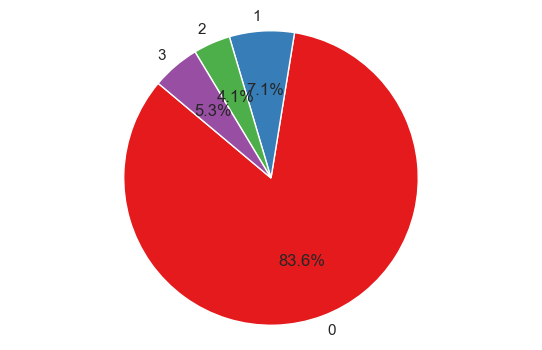

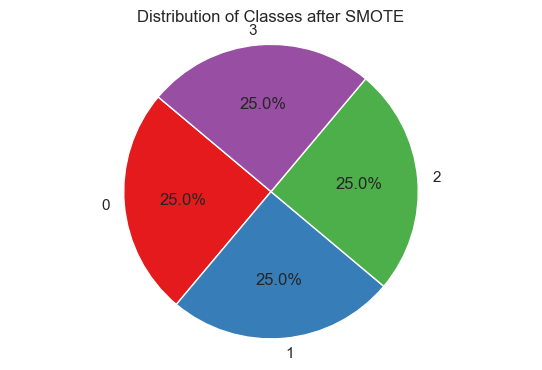

In [70]:
# Apply SMOTE to balance the dataset and show a pie chart of the new class distribution
sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X_copy, y_copy)

# Print class distribution before and after SMOTE
print("Class distribution BEFORE SMOTE:\n", pd.Series(y_copy).value_counts().sort_index())
print("\nClass distribution AFTER SMOTE:\n", pd.Series(y_resampled).value_counts().sort_index())

#pie chart of unbalanced classes
counts = pd.Series(y_copy).value_counts().sort_index()
plt.figure(figsize=(6,4))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')

# Pie chart of the balanced classes
counts = pd.Series(y_resampled).value_counts().sort_index()
plt.figure(figsize=(6,4))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Distribution of Classes after SMOTE')
plt.show()

PCA of balanced data

In [72]:
# Train test split of balanced data
# 30% would be a good percentage for testing our model
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, shuffle=True, random_state=2021)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(131227, 54) (56241, 54) (131227,) (56241,)


In [73]:
#standardize the data on balanced data
# Train Data Scaler
train_scaler = preprocessing.StandardScaler().fit(X_train)
# mean, scale
print("means:", "\n", train_scaler.mean_)
print("scales:", "\n", train_scaler.scale_)

means: 
 [  1.87346445  11.7483621   18.11230427  20.78529288  27.84628772
   1.40541168   2.51360595  99.1663255  108.53367066  90.74150348
 209.4999006   27.33901784  36.40585512   1.65496871   3.4835099
 171.99108271 276.00585165   3.52589      5.11869468  30.10214105
  56.63157945   1.27062603   2.02407841  14.1630262   19.37518524
 134.47300589 142.07881827  22.4797473   42.3265409    8.5427088
  15.94090638  66.8265651  115.98445277  88.00984252  81.70664117
 159.20220968 118.18376908  37.08669788  92.38944172  59.33643367
  50.46438002 117.54988029  76.92104095  10.52241582  31.41512526
  19.45476373  35.70701112  37.79260625  36.79874184  85.77199473
  99.75806751  96.7038933   90.88761437 223.35791762]
scales: 
 [1.68786597e+00 3.18657921e+00 4.83072569e+00 4.60261155e+00
 4.43678891e+00 1.27491991e+00 2.42763224e+00 5.35151526e+00
 5.64552066e+00 2.84348618e+01 1.19194370e+02 6.19116230e+00
 5.14926564e+00 1.06987335e+00 2.67077230e+00 1.03299182e+02
 1.38481581e+02 4.8805660

In [74]:
# Fit
X_train = train_scaler.transform(X_train)

In [75]:
print(X_train.std(axis=0))

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1.]


In [76]:
# Train Data Scaler
test_scaler = preprocessing.StandardScaler().fit(X_test)
# Fit
X_test = test_scaler.transform(X_test)

In [77]:
time_start = time.time()

pca = PCA(n_components=4)
pca_result = pca.fit_transform(X_test)

print("PCA done! Time elapsed {} seconds".format(time.time() - time_start))

PCA done! Time elapsed 0.2964286804199219 seconds


In [78]:
# Check the PCA components
pca_df = pd.DataFrame(columns=["PCA1", "PCA2", "PCA3", "PCA4"])

for i in range(4):
  pca_df["PCA{}".format(i+1)] = pca_result[:, i]

print("Variance explained per principle component: {}".format(pca.explained_variance_ratio_))
print(pca_df)

Variance explained per principle component: [0.13306808 0.08077183 0.08001033 0.06645746]
         PCA1      PCA2      PCA3      PCA4  
0     -3.182938  0.752808 -1.206333 -2.377814
1     -1.226695  2.651289 -1.028800  1.456384
2      4.533484 -2.317559  0.635117 -0.064834
3      5.944301  3.202817 -1.014543  2.172076
4     -2.183699  1.671353 -2.186737  2.163365
...         ...       ...       ...       ...
56236  1.946446 -4.660563  0.329630  1.687895
56237 -0.325317  2.460911  0.393528 -3.096382
56238  2.913067  6.587400  9.796998 -0.164095
56239 -1.825085 -0.851065 -1.299710 -1.812480
56240  6.007033 -0.182989 -3.074796 -0.540699

[56241 rows x 4 columns]


Shape of your Data Set loaded: (56241, 5)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    4 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################
To fix these data quality

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
PCA1,float64,0.000000,NA,-9.238058,27.844200,Column has 1787 outliers greater than upper bound (6.04) or lower than lower bound(-6.43). Cap them or remove them.
PCA2,float64,0.000000,NA,-8.805256,17.364806,Column has 732 outliers greater than upper bound (5.37) or lower than lower bound(-5.39). Cap them or remove them.
PCA3,float64,0.000000,NA,-9.839465,20.375565,Column has 1932 outliers greater than upper bound (4.67) or lower than lower bound(-4.96). Cap them or remove them.
PCA4,float64,0.000000,NA,-5.669416,17.258790,Column has 1870 outliers greater than upper bound (4.40) or lower than lower bound(-4.72). Cap them or remove them.
aki_stage,int64,0.000000,0,0.000000,3.000000,Target column


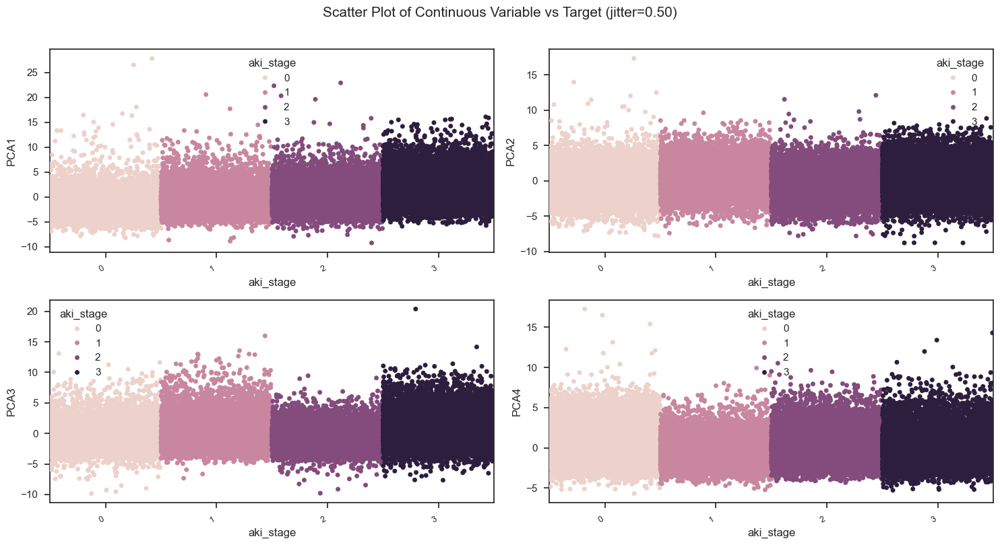

Total Number of Scatter Plots = 10


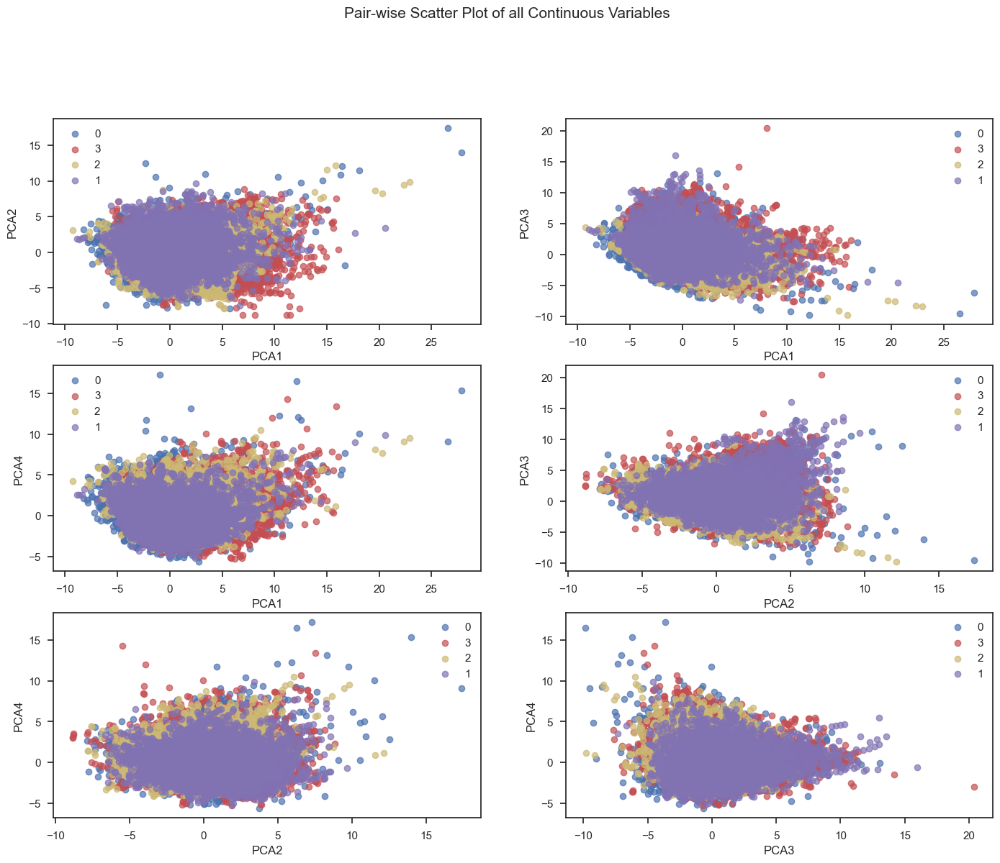

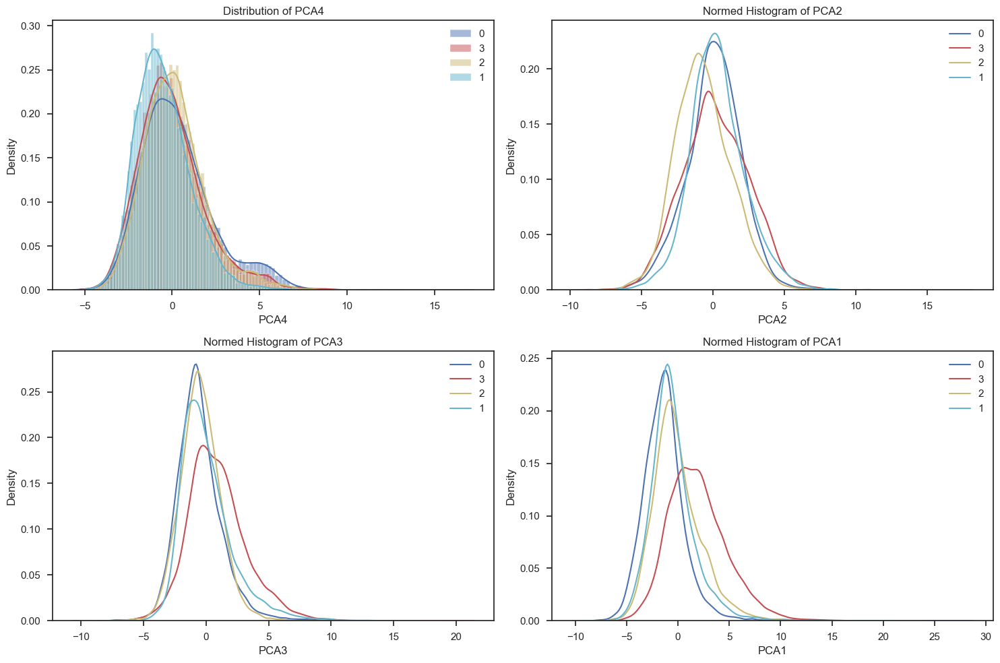

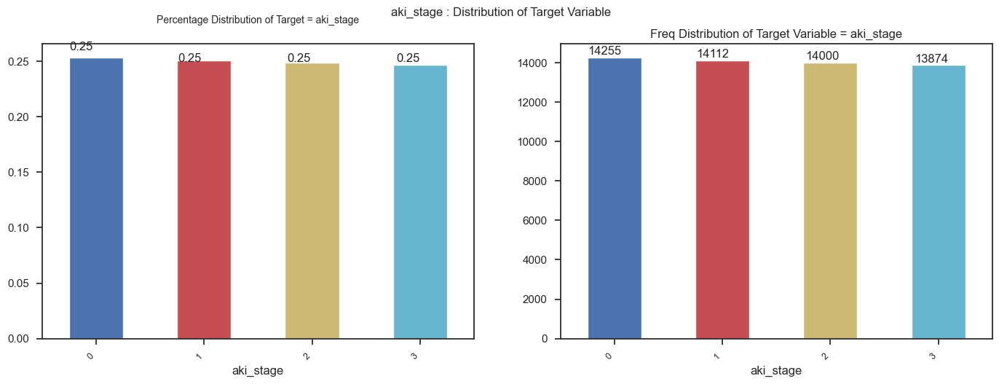

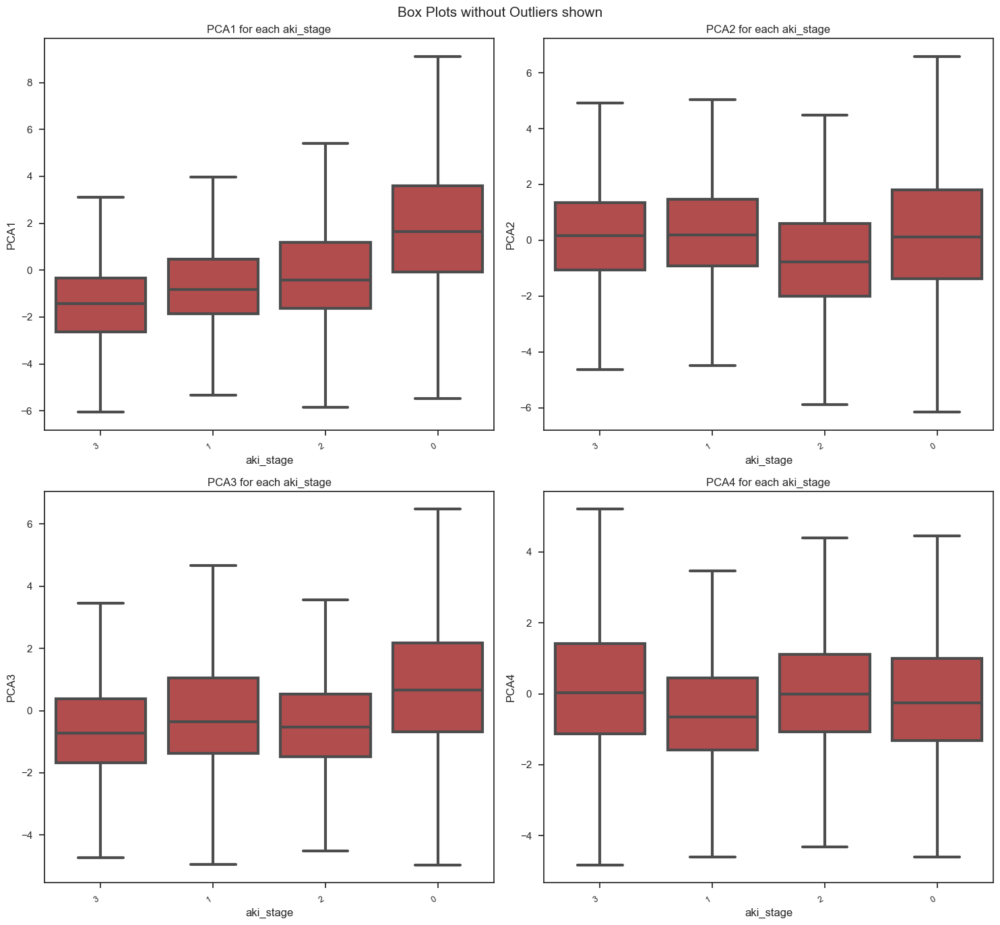

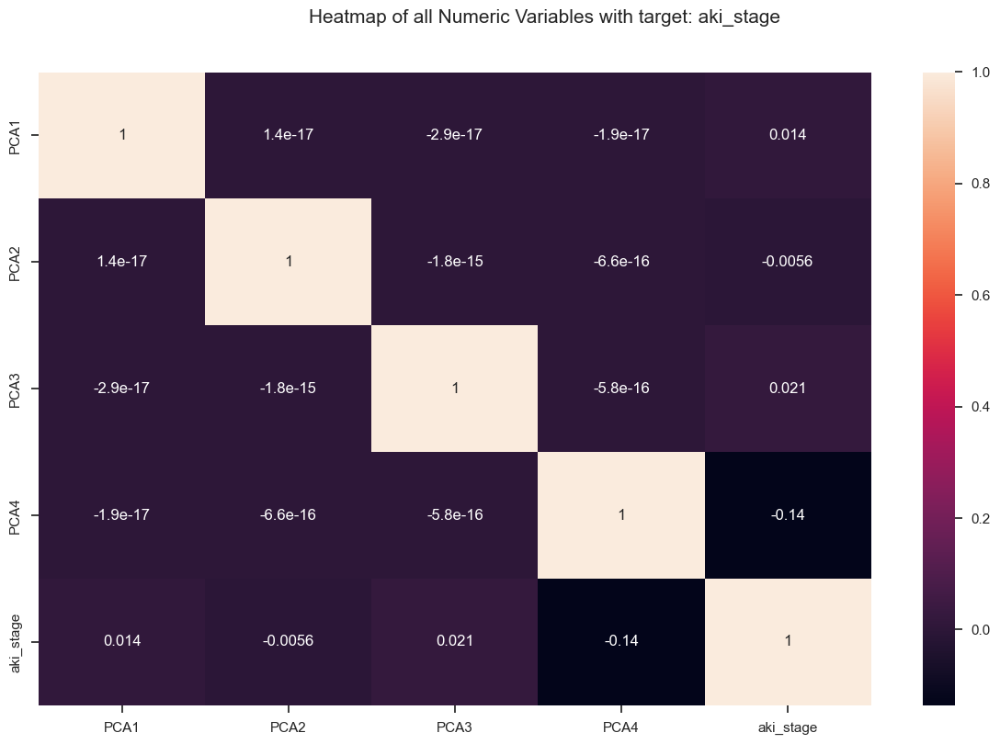

All Plots done
Time to run AutoViz = 19 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [79]:
# Visualize the unbalanced data after PCA transformation
pca_df = pca_df.reset_index(drop=True)
df_y = pd.Series(y_test, name="aki_stage").reset_index(drop=True)
df_av = pd.concat([pca_df, df_y], axis=1)
%matplotlib inline
from autoviz import AutoViz_Class
AV = AutoViz_Class()
dft = AV.AutoViz(df_av, depVar="aki_stage", save_plot_dir=r"d:\Users\.virtualenvs\.virtualenvs\new_env\ai311\UHD\DM")

We can clearly see the significant difference between unbalanced and balanced autoviz report after using SMOTE balancing method.
Let us now consider the difference between unbalanced and balanced datasets for training the models with KNN, Decision Trees, and Naive Gaussian.

## Training (on Unbalanced and Balanced Datasets(before and after optimization))
1. KNN 
2. Decision Tree
3. Naive Gaussian

### *KNN* - Unbalanced

In [96]:
# this section is for KNN on unbalanced data that loops through different k values to find the best k

error_rate = []

knn_unbalanced = KNeighborsClassifier(n_neighbors=3)
knn_unbalanced.fit(X_train_un, y_train_un)
pred_i = knn_unbalanced.predict(X_test_un)

error_rate.append(np.mean(pred_i != y_test_un))


### *KNN Evaluation* Unbalanced 
before optimization

              precision    recall  f1-score   support

           0       0.86      0.97      0.91     14074
           1       0.22      0.07      0.11      1158
           2       0.11      0.02      0.03       710
           3       0.49      0.19      0.28       886

    accuracy                           0.83     16828
   macro avg       0.42      0.31      0.33     16828
weighted avg       0.76      0.83      0.78     16828



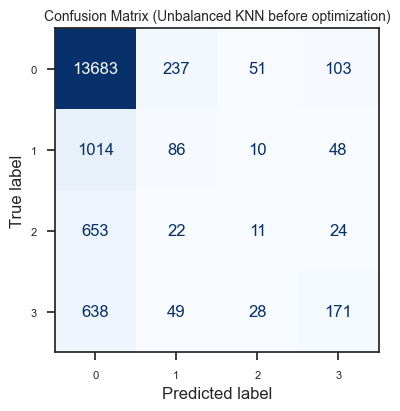

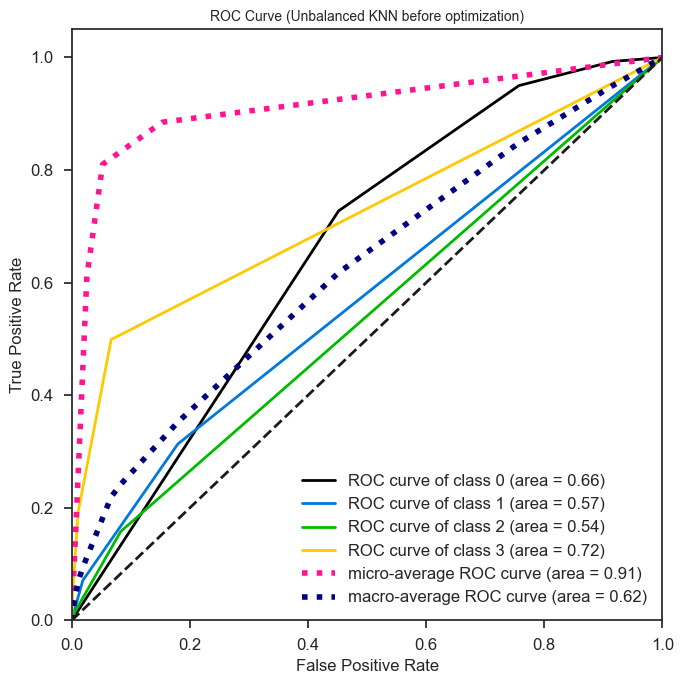

In [100]:
# KNN Evaluation Unbalanced before optimization (smaller plot)
knn_unbalanced = KNeighborsClassifier(n_neighbors=3)
knn_unbalanced.fit(X_train_un, y_train_un)
y_pred_un = knn_unbalanced.predict(X_test_un)

# classification report for unbalanced data before optimization
print(classification_report(y_test_un, y_pred_un))
cm = confusion_matrix(y_test_un, y_pred_un)

# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn_unbalanced.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix (Unbalanced KNN before optimization)', fontsize=10)

#ROC Curve
y_probas_un = knn_unbalanced.predict_proba(X_test_un)
skplt.metrics.plot_roc(y_test_un, y_probas_un, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Unbalanced KNN before optimization)', fontsize=10)

# reduce tick label size for compact display
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(8)

plt.tight_layout()
plt.show()

Optimization KNN - Unbalanced

In [88]:
#KNN Unbalanced Optimization using GridSearchCV
param_grid = {'n_neighbors': np.arange(1, 50)}
knn_unbalanced_gs = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
knn_unbalanced_gs.fit(X_train_un, y_train_un)   
print("Best parameters (Unbalanced KNN after optimization):", knn_unbalanced_gs.best_params_)
print("Best cross-validation score (Unbalanced KNN after optimization):", knn_unbalanced_gs.best_score_)


Best parameters (Unbalanced KNN after optimization): {'n_neighbors': 22}
Best cross-validation score (Unbalanced KNN after optimization): 0.8422004329555584


Evaluation of KNN Unbalanced after optimization

              precision    recall  f1-score   support

           0       0.85      0.99      0.92     14074
           1       0.32      0.03      0.05      1158
           2       0.00      0.00      0.00       710
           3       0.61      0.18      0.27       886

    accuracy                           0.84     16828
   macro avg       0.44      0.30      0.31     16828
weighted avg       0.76      0.84      0.78     16828



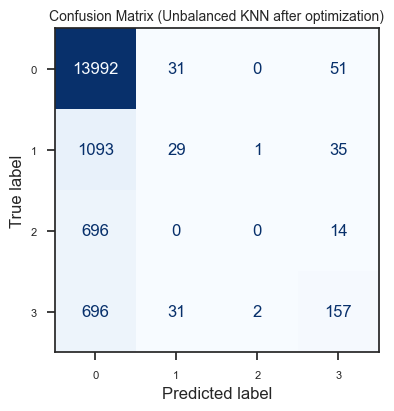

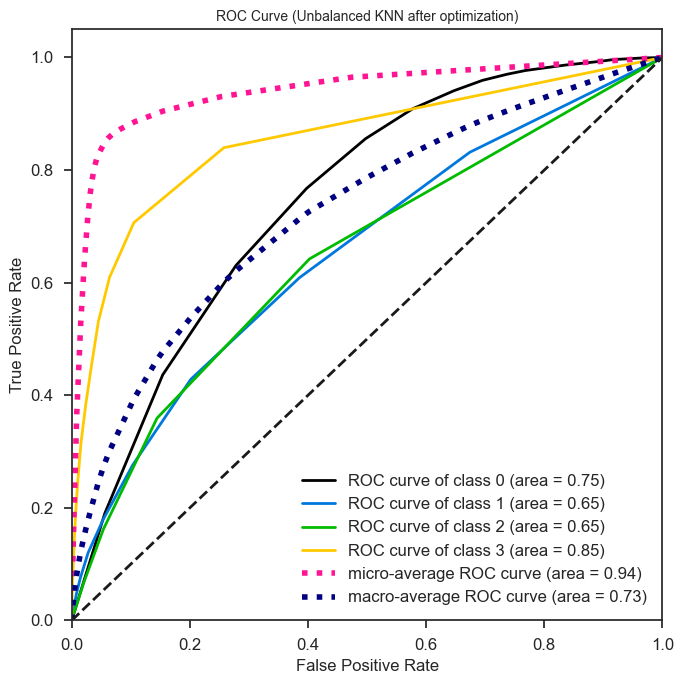

In [89]:
#Evaluate the optimized KNN model on unbalanced data
knn_unbalanced_opt = KNeighborsClassifier(n_neighbors=knn_unbalanced_gs.best_params_['n_neighbors'])
knn_unbalanced_opt.fit(X_train_un, y_train_un)
y_pred_un_opt = knn_unbalanced_opt.predict(X_test_un)
# classification report for unbalanced data after optimization
print(classification_report(y_test_un, y_pred_un_opt))
cm = confusion_matrix(y_test_un, y_pred_un_opt)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn_unbalanced_opt.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix (Unbalanced KNN after optimization)', fontsize=10)

#ROC Curve
y_probas_un_opt = knn_unbalanced_opt.predict_proba(X_test_un)
skplt.metrics.plot_roc(y_test_un, y_probas_un_opt, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Unbalanced KNN after optimization)', fontsize=10)
# reduce tick label size for compact display
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(8)
plt.tight_layout()
plt.show()

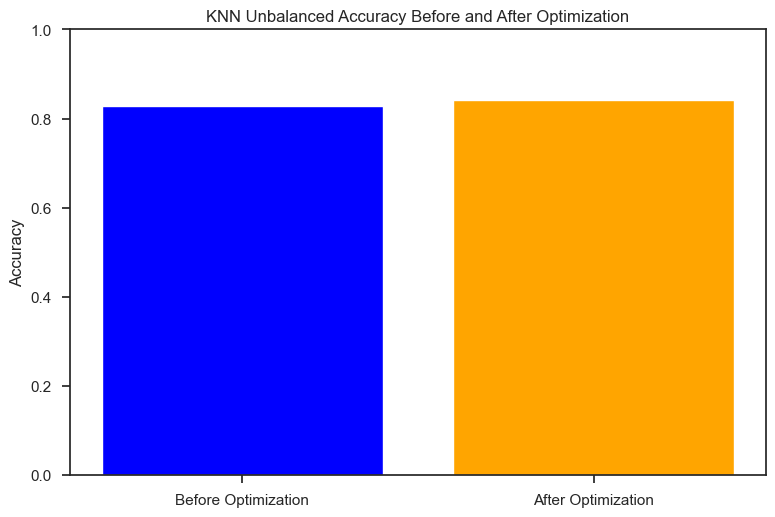

In [101]:
#comparision of KNN unbalanced before and after optimization
# bar chart for KNN unbalanced before and after optimization
import matplotlib.pyplot as plt
labels = ['Before Optimization', 'After Optimization']
before_opt = accuracy_score(y_test_un, y_pred_un)
after_opt = accuracy_score(y_test_un, y_pred_un_opt)

# Bar chart
plt.bar(labels, [before_opt, after_opt], color=['blue', 'orange'])
plt.ylabel('Accuracy')
plt.title('KNN Unbalanced Accuracy Before and After Optimization')
plt.ylim(0, 1)
plt.show()

### *Decision Tree* - Unbalanced

In [90]:
tree_unbalanced = DecisionTreeClassifier() # decision tree algorithm
tree_unbalanced.fit(X_train_un, y_train_un)

DecisionTreeClassifier()

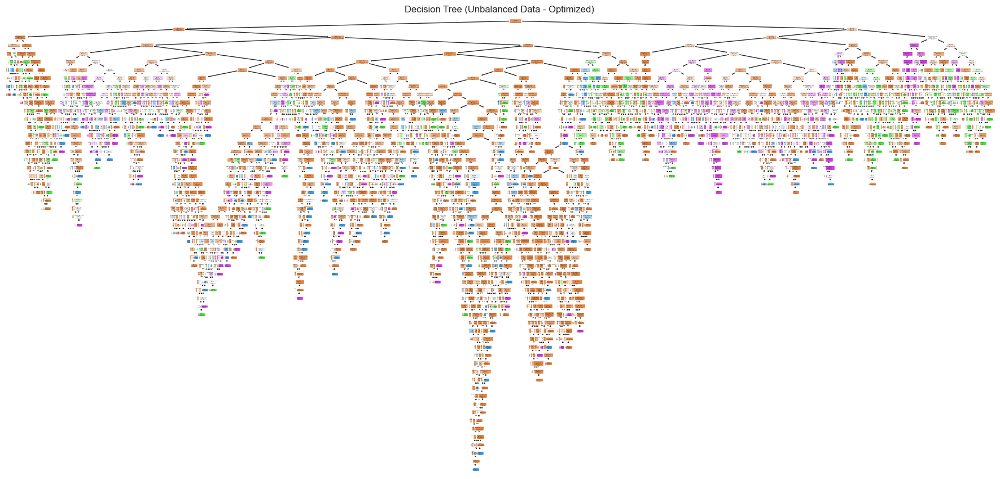

In [ ]:
#visualize the decision tree
plt.figure(figsize=(20,10))
plot_tree(tree_unbalanced, filled=True, feature_names=X.columns, class_names=['0', '1', '2', '3'])
plt.title("Decision Tree (Unbalanced Data - Not Optimized)")
plt.show()

In [91]:
print(f'Decision tree of unbalanced data has {tree_unbalanced.tree_.node_count} nodes with maximum depth {tree_unbalanced.tree_.max_depth}.') 
print(f'Model Accuracy - Unbalanced: {tree_unbalanced.score(X_train_un, y_train_un)}') # training accuracy

Decision tree of unbalanced data has 5435 nodes with maximum depth 55.
Model Accuracy - Unbalanced: 1.0


              precision    recall  f1-score   support

           0       0.93      0.92      0.93     14074
           1       0.60      0.63      0.61      1158
           2       0.34      0.36      0.35       710
           3       0.51      0.54      0.52       886

    accuracy                           0.86     16828
   macro avg       0.60      0.61      0.60     16828
weighted avg       0.86      0.86      0.86     16828



Text(0.5, 1.0, 'ROC Curve (Unbalanced Decision Tree)')

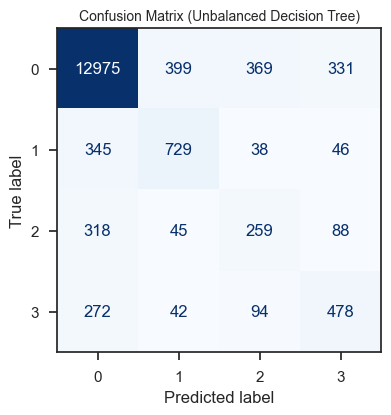

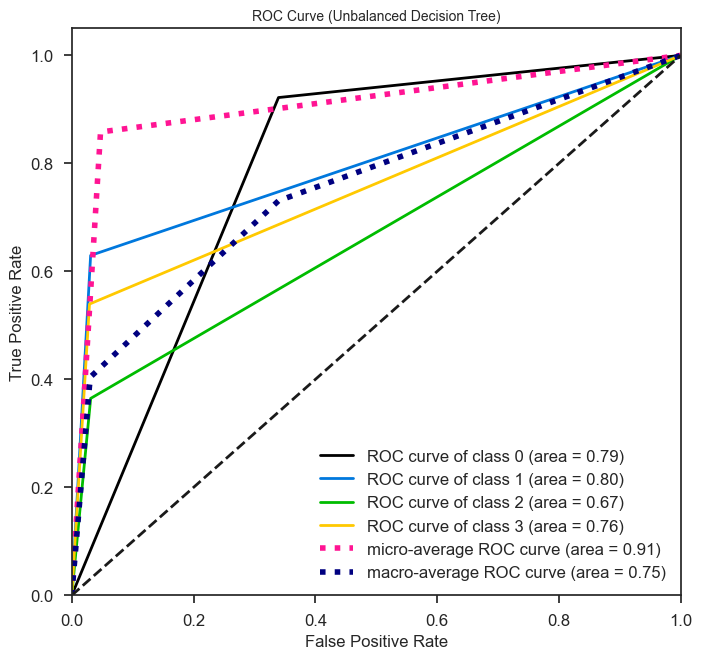

In [92]:
#Evalation of Decision Tree on Unbalanced Data
#Confusion Matrix
y_pred_tree_un = tree_unbalanced.predict(X_test_un)
print(classification_report(y_test_un, y_pred_tree_un))
cm = confusion_matrix(y_test_un, y_pred_tree_un)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size  
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree_unbalanced.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix (Unbalanced Decision Tree)', fontsize=10)

#ROC Curve
y_probas_tree_un = tree_unbalanced.predict_proba(X_test_un)

skplt.metrics.plot_roc(y_test_un, y_probas_tree_un, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Unbalanced Decision Tree)', fontsize=10)

In [102]:
#optimize the Decision Tree using GridSearchCV on Unbalanced Data
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
tree_unbalanced_gs = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
tree_unbalanced_gs.fit(X_train_un, y_train_un)

print("Best parameters (Unbalanced Decision Tree after optimization):", tree_unbalanced_gs.best_params_)
print("Best cross-validation score (Unbalanced Decision Tree after optimization):", tree_unbalanced_gs.best_score_)


Best parameters (Unbalanced Decision Tree after optimization): {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 5}
Best cross-validation score (Unbalanced Decision Tree after optimization): 0.899579778428626


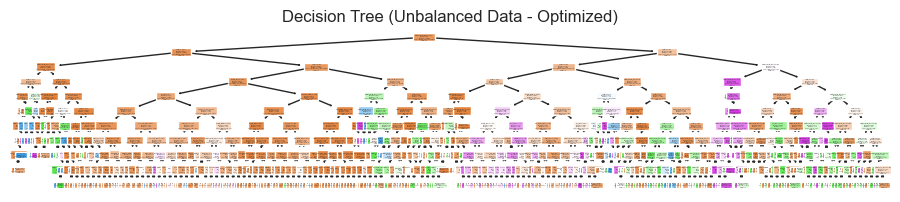

In [109]:
#visualize the decision tree (use the best estimator found by GridSearchCV)
plt.figure(figsize=(10,2))
# GridSearchCV returns the fitted estimator in .best_estimator_
plot_tree(tree_unbalanced_gs.best_estimator_, filled=True, feature_names=X.columns, class_names=['0', '1', '2', '3'])
plt.title("Decision Tree (Unbalanced Data - Optimized)")
plt.show()

              precision    recall  f1-score   support

           0       0.92      0.97      0.95     14074
           1       0.81      0.65      0.72      1158
           2       0.71      0.29      0.41       710
           3       0.68      0.58      0.62       886

    accuracy                           0.90     16828
   macro avg       0.78      0.62      0.68     16828
weighted avg       0.89      0.90      0.89     16828



Text(0.5, 1.0, 'ROC Curve (Unbalanced Decision Tree after optimization)')

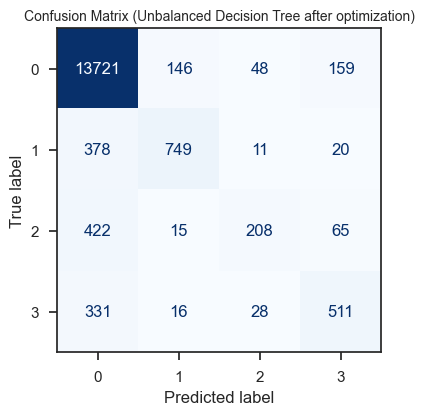

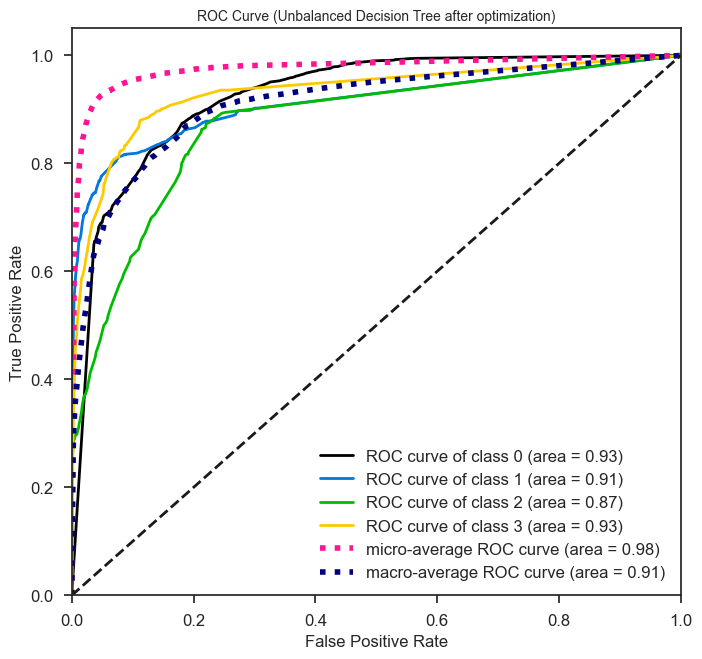

In [110]:
#Evaluation of the optimized Decision Tree on Unbalanced Data
tree_unbalanced_opt = tree_unbalanced_gs.best_estimator_
y_pred_tree_un_opt = tree_unbalanced_opt.predict(X_test_un)
print(classification_report(y_test_un, y_pred_tree_un_opt))
cm = confusion_matrix(y_test_un, y_pred_tree_un_opt)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size  
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree_unbalanced_opt.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)  

ax.set_title('Confusion Matrix (Unbalanced Decision Tree after optimization)', fontsize=10)
#ROC Curve
y_probas_tree_un_opt = tree_unbalanced_opt.predict_proba(X_test_un) 
skplt.metrics.plot_roc(y_test_un, y_probas_tree_un_opt, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Unbalanced Decision Tree after optimization)', fontsize=10)



(0.0, 1.0)

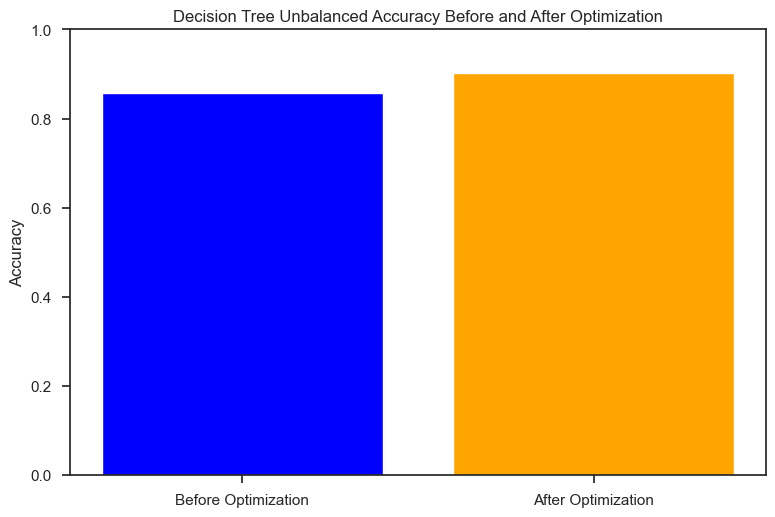

In [111]:
#compare decision tree unbalanced before and after optimization
# bar chart for decision tree unbalanced before and after optimization
import matplotlib.pyplot as plt
labels = ['Before Optimization', 'After Optimization']  
before_opt = accuracy_score(y_test_un, y_pred_tree_un)
after_opt = accuracy_score(y_test_un, y_pred_tree_un_opt)
# Bar chart
plt.bar(labels, [before_opt, after_opt], color=['blue', 'orange'])
plt.ylabel('Accuracy')
plt.title('Decision Tree Unbalanced Accuracy Before and After Optimization')
plt.ylim(0, 1)

### *Naive Gaussian* - Unbalanced

In [112]:
#Gaussian Naive Bayes on Unbalanced Data
gnb_unbalanced = GaussianNB()
gnb_unbalanced.fit(X_train_un, y_train_un)
y_pred_gnb_un = gnb_unbalanced.predict(X_test_un)


In [113]:
gnb_unbalanced.fit(X_train, y_train)

GaussianNB()

              precision    recall  f1-score   support

           0       0.91      0.74      0.82     14074
           1       0.16      0.21      0.18      1158
           2       0.09      0.33      0.14       710
           3       0.27      0.38      0.32       886

    accuracy                           0.67     16828
   macro avg       0.36      0.41      0.36     16828
weighted avg       0.79      0.67      0.72     16828



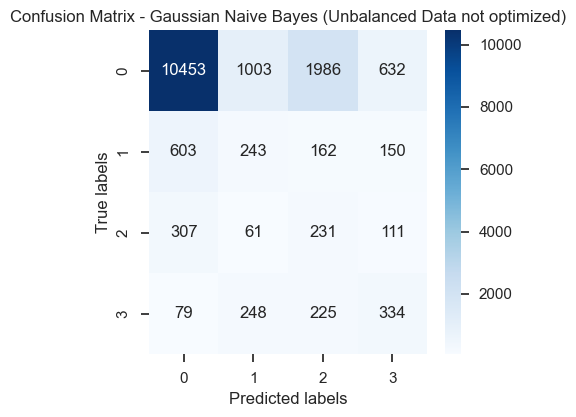

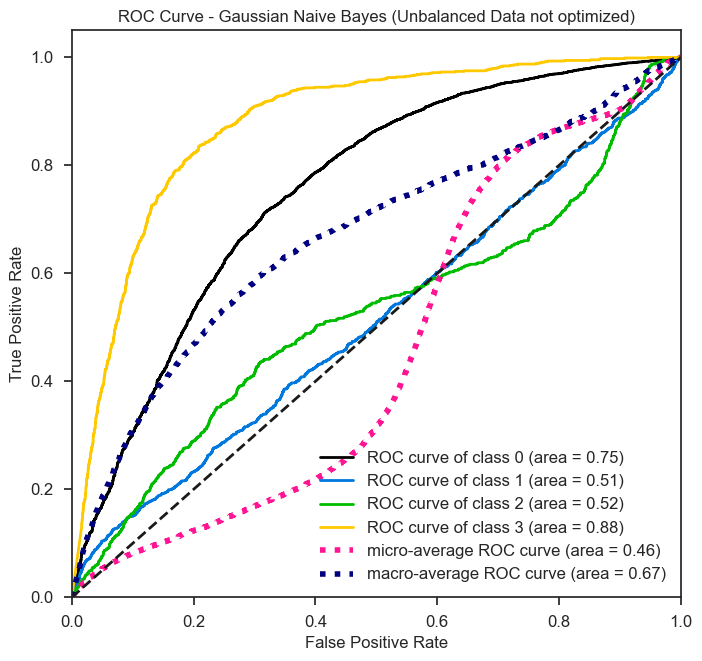

In [114]:
#evaluation of Gaussian Naive Bayes on Unbalanced Data not optimized
print(classification_report(y_test_un, y_pred_gnb_un))
cm = confusion_matrix(y_test_un, y_pred_gnb_un)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix - Gaussian Naive Bayes (Unbalanced Data not optimized)')
plt.show()  
#ROC Curve
y_probas_gnb_un = gnb_unbalanced.predict_proba(X_test_un)
skplt.metrics.plot_roc(y_test_un, y_probas_gnb_un, figsize=(7, 7))  # reduced size
plt.title('ROC Curve - Gaussian Naive Bayes (Unbalanced Data not optimized)')
plt.show()

In [115]:
#optimize Gaussian Naive Bayes on Unbalanced Data using GridSearchCV
param_grid = {
    'var_smoothing': np.logspace(0, -9, num=100)
}   
gnb_unbalanced_gs = GridSearchCV(GaussianNB(), param_grid, cv=5)
gnb_unbalanced_gs.fit(X_train_un, y_train_un)
print("Best parameters (Unbalanced Gaussian Naive Bayes after optimization):", gnb_unbalanced_gs.best_params_)
print("Best cross-validation score (Unbalanced Gaussian Naive Bayes after optimization):", gnb_unbalanced_gs.best_score_)


Best parameters (Unbalanced Gaussian Naive Bayes after optimization): {'var_smoothing': 1.0}
Best cross-validation score (Unbalanced Gaussian Naive Bayes after optimization): 0.8097287660766586


              precision    recall  f1-score   support

           0       0.88      0.93      0.90     14074
           1       0.19      0.13      0.15      1158
           2       0.15      0.08      0.11       710
           3       0.31      0.26      0.29       886

    accuracy                           0.80     16828
   macro avg       0.38      0.35      0.36     16828
weighted avg       0.77      0.80      0.79     16828



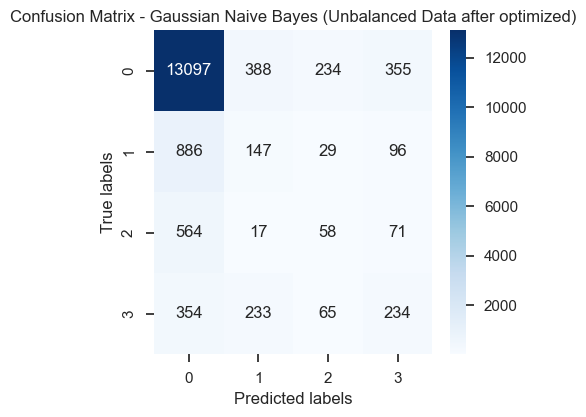

Text(0.5, 1.0, 'ROC Curve - Gaussian Naive Bayes (Unbalanced Data after optimized)')

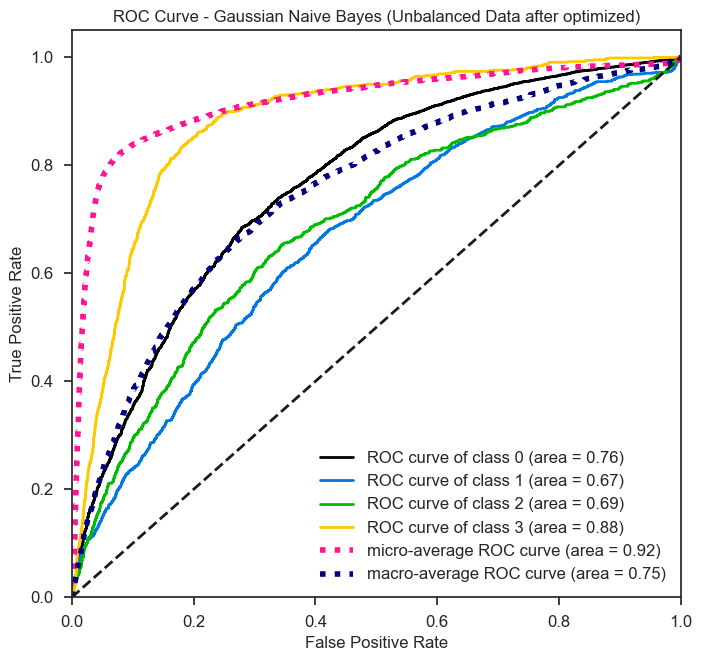

In [116]:
#Evaluate the optimized gaussian Naive Bayes model on Unbalanced Data
gnb_unbalanced_opt = gnb_unbalanced_gs.best_estimator_
y_pred_gnb_un_opt = gnb_unbalanced_opt.predict(X_test_un)
# classification report for unbalanced data after optimization
print(classification_report(y_test_un, y_pred_gnb_un_opt))
cm = confusion_matrix(y_test_un, y_pred_gnb_un_opt)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix - Gaussian Naive Bayes (Unbalanced Data after optimized)')
plt.show()

#ROC Curve
y_probas_gnb_un_opt = gnb_unbalanced_opt.predict_proba(X_test_un)
skplt.metrics.plot_roc(y_test_un, y_probas_gnb_un_opt, figsize
=(7, 7))  # reduced size
plt.title('ROC Curve - Gaussian Naive Bayes (Unbalanced Data after optimized)') 

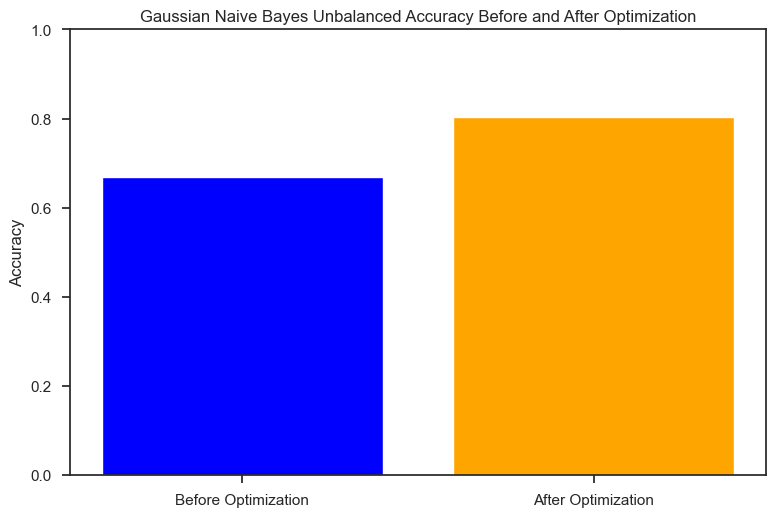

In [117]:
#compare gaussian naive bayes unbalanced before and after optimization
# bar chart for gaussian naive bayes unbalanced before and after optimization
import matplotlib.pyplot as plt
labels = ['Before Optimization', 'After Optimization']
before_opt = accuracy_score(y_test_un, y_pred_gnb_un)
after_opt = accuracy_score(y_test_un, y_pred_gnb_un_opt)
# Bar chart
plt.bar(labels, [before_opt, after_opt], color=['blue', 'orange'])
plt.ylabel('Accuracy')
plt.title('Gaussian Naive Bayes Unbalanced Accuracy Before and After Optimization')
plt.ylim(0, 1)
plt.show()

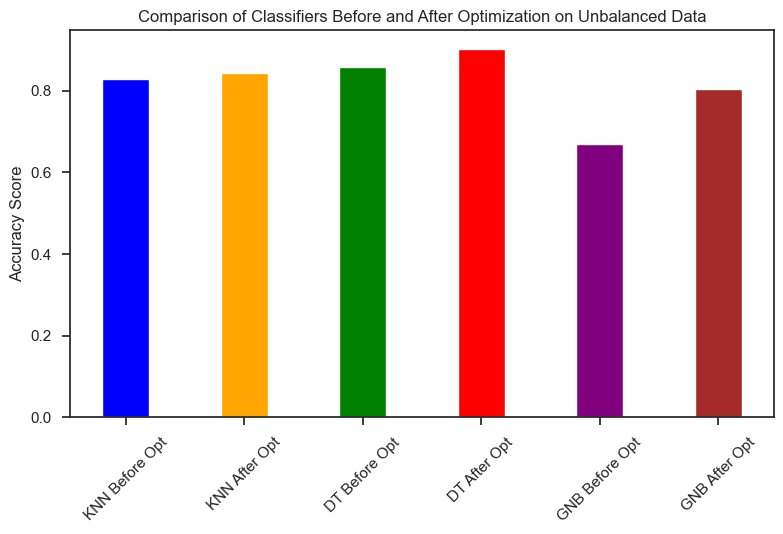

KNN Before Optimization Accuracy: 0.8290349417637272
KNN After Optimization Accuracy: 0.8425243641549798
Decision Tree Before Optimization Accuracy: 0.858153078202995
Decision Tree After Optimization Accuracy: 0.9026028048490611
Gaussian Naive Bayes Before Optimization Accuracy: 0.6691823151889708
Gaussian Naive Bayes After Optimization Accuracy: 0.8043736629427145


In [ ]:
#comparision of KNN, Decision Tree and Gaussian Naive Bayes on unbalanced data before and after optimization using cohen kappa score
import matplotlib.pyplot as plt
labels = ['KNN Before Opt', 'KNN After Opt', 'DT Before Opt', 'DT After Opt', 'GNB Before Opt', 'GNB After Opt']
knn_before_opt = accuracy_score(y_test_un, y_pred_un)    
knn_after_opt = accuracy_score(y_test_un, y_pred_un_opt)
dt_before_opt = accuracy_score(y_test_un, y_pred_tree_un)
dt_after_opt = accuracy_score(y_test_un, y_pred_tree_un_opt)
gnb_before_opt = accuracy_score(y_test_un, y_pred_gnb_un)
gnb_after_opt = accuracy_score(y_test_un, y_pred_gnb_un_opt)
# Bar chart
plt.bar(labels, [knn_before_opt, knn_after_opt, dt_before_opt, dt_after_opt, gnb_before_opt, gnb_after_opt], color=['blue', 'orange', 'green', 'red', 'purple', 'brown'], width=0.4)
plt.ylabel('Accuracy Score')
plt.title('Comparison of Classifiers Before and After Optimization on Unbalanced Data')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#output numerical values of accuracy for KNN, Decision Tree and Gaussian Naive Bayes on unbalanced data before and after optimization
print("KNN Before Optimization Accuracy:", accuracy_score(y_test_un, y_pred_un))
print("KNN After Optimization Accuracy:", accuracy_score(y_test_un, y_pred_un_opt))
print("Decision Tree Before Optimization Accuracy:", accuracy_score(y_test_un, y_pred_tree_un))
print("Decision Tree After Optimization Accuracy:", accuracy_score(y_test_un, y_pred_tree_un_opt))
print("Gaussian Naive Bayes Before Optimization Accuracy:", accuracy_score(y_test_un, y_pred_gnb_un))
print("Gaussian Naive Bayes After Optimization Accuracy:", accuracy_score(y_test_un, y_pred_gnb_un_opt))


### *Training* - Balanced Dataset
Now that we have seen the performance of unbalanced dataset, lets see balanced
#### *KNN* - Balanced

              precision    recall  f1-score   support

           0       0.99      0.43      0.60     13874
           1       0.77      1.00      0.87     14112
           2       0.84      1.00      0.91     14000
           3       0.93      1.00      0.96     14255

    accuracy                           0.86     56241
   macro avg       0.88      0.86      0.84     56241
weighted avg       0.88      0.86      0.84     56241



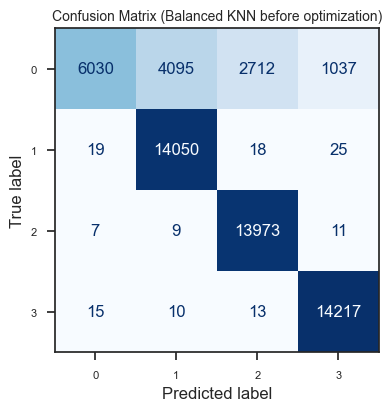

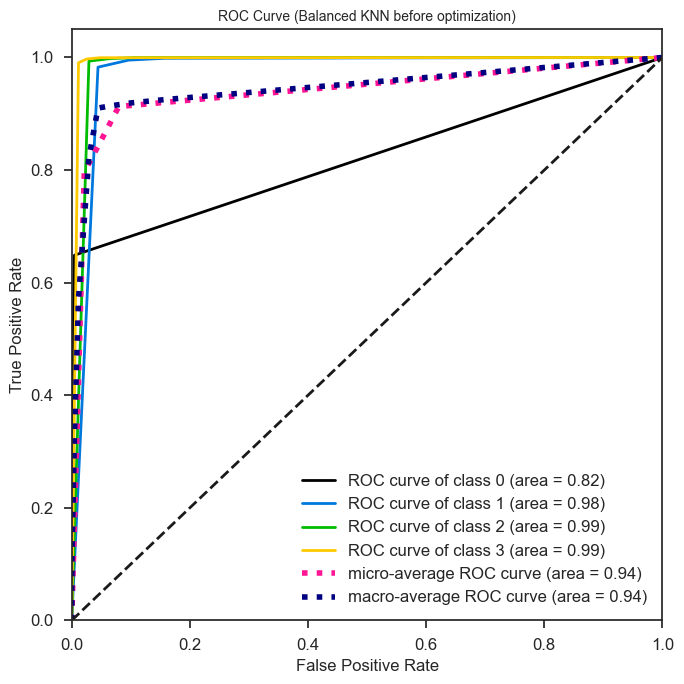

In [125]:
# KNN Evaluation balanced before optimization (smaller plot)
knn_balanced = KNeighborsClassifier(n_neighbors=3)
knn_balanced.fit(X_train, y_train)
y_pred_bal = knn_balanced.predict(X_test)

# classification report for balanced data before optimization
print(classification_report(y_test, y_pred_bal))
cm = confusion_matrix(y_test, y_pred_bal)

# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn_balanced.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix (Balanced KNN before optimization)', fontsize=10)

#ROC Curve
y_probas_bal = knn_balanced.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, y_probas_bal, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Balanced KNN before optimization)', fontsize=10)

# reduce tick label size for compact display
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(8)

plt.tight_layout()
plt.show()

Optimization KNN - balanced

In [126]:
#KNN balanced Optimization using GridSearchCV
param_grid = {'n_neighbors': np.arange(1, 50)}
knn_balanced_gs = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
knn_balanced_gs.fit(X_train, y_train)   
print("Best parameters (Balanced KNN after optimization):", knn_balanced_gs.best_params_)
print("Best cross-validation score (Balanced KNN after optimization):", knn_balanced_gs.best_score_)


Best parameters (Balanced KNN after optimization): {'n_neighbors': 2}
Best cross-validation score (Balanced KNN after optimization): 0.8869820745948032


Evaluation of KNN Unbalanced after optimization

              precision    recall  f1-score   support

           0       0.99      0.59      0.74     13874
           1       0.81      1.00      0.89     14112
           2       0.88      1.00      0.94     14000
           3       0.96      1.00      0.98     14255

    accuracy                           0.90     56241
   macro avg       0.91      0.89      0.89     56241
weighted avg       0.91      0.90      0.89     56241



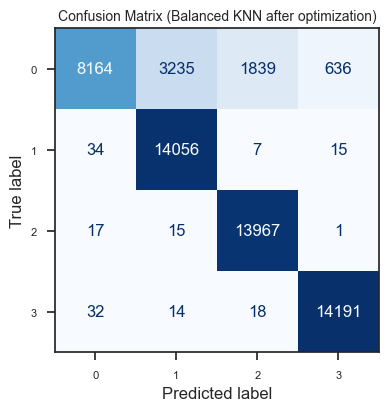

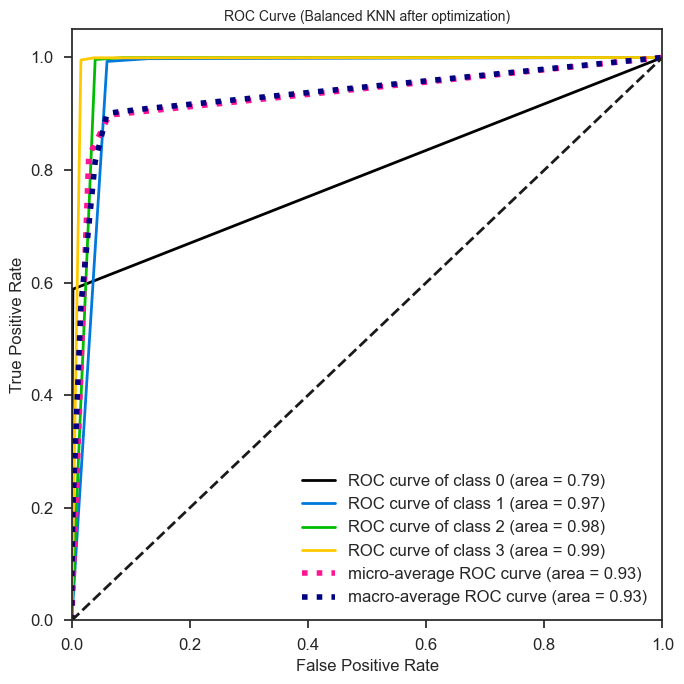

In [128]:
#Evaluate the optimized KNN model on balanced data
knn_balanced_opt = KNeighborsClassifier(n_neighbors=knn_balanced_gs.best_params_['n_neighbors'])
knn_balanced_opt.fit(X_train, y_train)
y_pred_bal_opt = knn_balanced_opt.predict(X_test)
# classification report for balanced data after optimization
print(classification_report(y_test, y_pred_bal_opt))
cm = confusion_matrix(y_test, y_pred_bal_opt)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn_balanced_opt.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix (Balanced KNN after optimization)', fontsize=10)

#ROC Curve
y_probas_bal_opt = knn_balanced_opt.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, y_probas_bal_opt, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Balanced KNN after optimization)', fontsize=10)
# reduce tick label size for compact display
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(8)
plt.tight_layout()
plt.show()

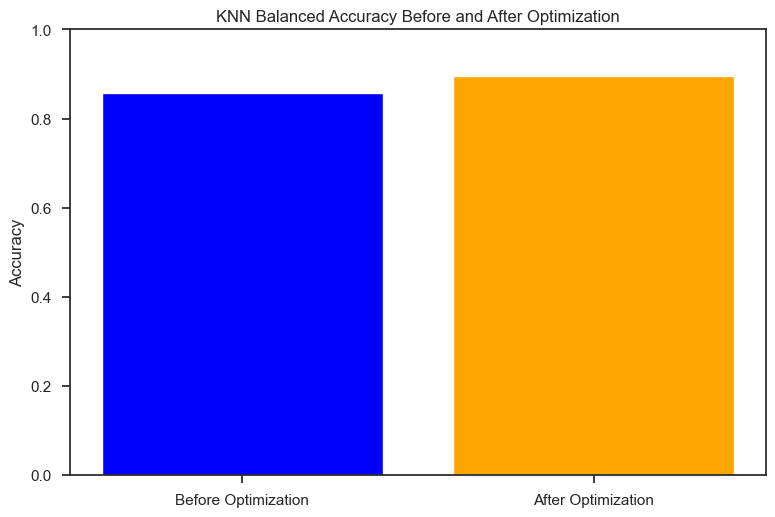

In [129]:
#comparision of KNN balanced before and after optimization
# bar chart for KNN balanced before and after optimization
import matplotlib.pyplot as plt
labels = ['Before Optimization', 'After Optimization']
before_opt = accuracy_score(y_test, y_pred_bal)
after_opt = accuracy_score(y_test, y_pred_bal_opt)

# Bar chart
plt.bar(labels, [before_opt, after_opt], color=['blue', 'orange'])
plt.ylabel('Accuracy')
plt.title('KNN Balanced Accuracy Before and After Optimization')
plt.ylim(0, 1)
plt.show()

### *Decision Tree* - balanced

In [130]:
tree_balanced = DecisionTreeClassifier() # decision tree algorithm
tree_balanced.fit(X_train, y_train)

DecisionTreeClassifier()

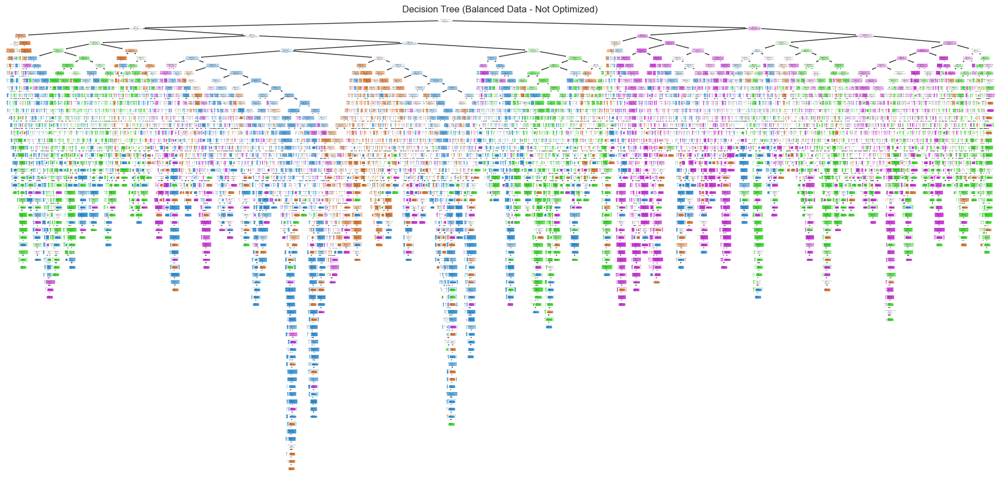

In [132]:
#visualize the decision tree
plt.figure(figsize=(20,10))
plot_tree(tree_balanced, filled=True, feature_names=X.columns, class_names=['0', '1', '2', '3'])
plt.title("Decision Tree (Balanced Data - Not Optimized)")
plt.show()

In [134]:
print(f'Decision tree of balanced data has {tree_balanced.tree_.node_count} nodes with maximum depth {tree_balanced.tree_.max_depth}.') 
print(f'Model Accuracy - Balanced: {tree_balanced.score(X_train, y_train)}') # training accuracy

Decision tree of balanced data has 23101 nodes with maximum depth 60.
Model Accuracy - Balanced: 1.0


              precision    recall  f1-score   support

           0       0.77      0.23      0.35     13874
           1       0.55      0.84      0.66     14112
           2       0.50      0.67      0.57     14000
           3       0.63      0.50      0.56     14255

    accuracy                           0.56     56241
   macro avg       0.61      0.56      0.54     56241
weighted avg       0.61      0.56      0.54     56241



Text(0.5, 1.0, 'ROC Curve (Balanced Decision Tree)')

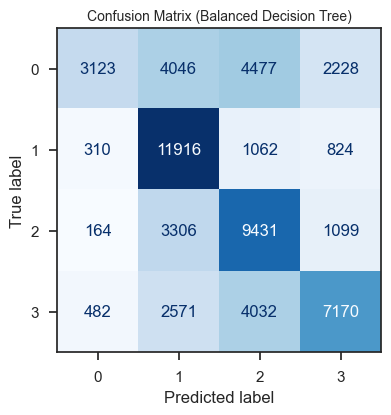

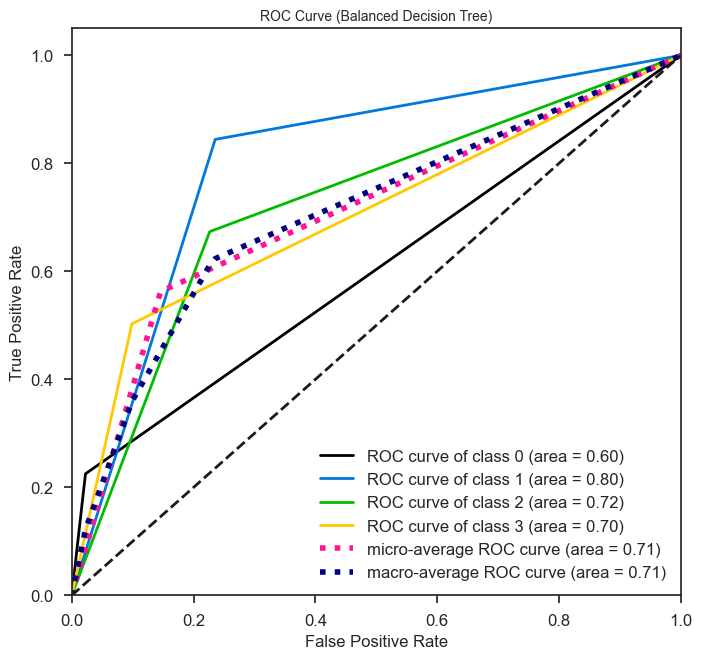

In [135]:
#Evalation of Decision Tree on balanced Data
#Confusion Matrix
y_pred_tree_bal = tree_balanced.predict(X_test)
print(classification_report(y_test, y_pred_tree_bal))
cm = confusion_matrix(y_test, y_pred_tree_bal)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree_balanced.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix (Balanced Decision Tree)', fontsize=10)

#ROC Curve
y_probas_tree_bal = tree_balanced.predict_proba(X_test)

skplt.metrics.plot_roc(y_test, y_probas_tree_bal, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Balanced Decision Tree)', fontsize=10)

In [140]:
#optimize the Decision Tree using GridSearchCV on balanced Data
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
tree_balanced_gs = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
tree_balanced_gs.fit(X_train, y_train)

print("Best parameters (Balanced Decision Tree after optimization):", tree_balanced_gs.best_params_)
print("Best cross-validation score (Balanced Decision Tree after optimization):", tree_balanced_gs.best_score_)


Best parameters (Balanced Decision Tree after optimization): {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best cross-validation score (Balanced Decision Tree after optimization): 0.7763493630984776


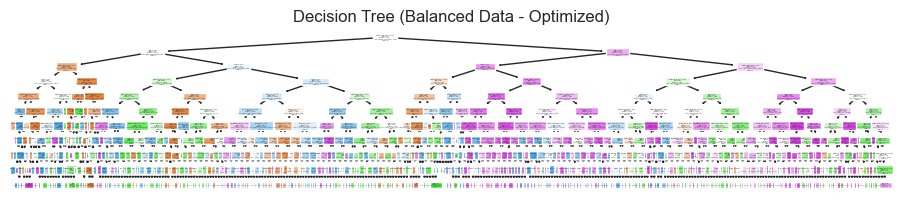

In [141]:
#visualize the decision tree (use the best estimator found by GridSearchCV)
plt.figure(figsize=(10,2))
# GridSearchCV returns the fitted estimator in .best_estimator_
plot_tree(tree_balanced_gs.best_estimator_, filled=True, feature_names=X.columns, class_names=['0', '1', '2', '3'])
plt.title("Decision Tree (Balanced Data - Optimized)")
plt.show()

              precision    recall  f1-score   support

           0       0.87      0.23      0.36     13874
           1       0.54      0.85      0.66     14112
           2       0.44      0.69      0.54     14000
           3       0.71      0.42      0.53     14255

    accuracy                           0.55     56241
   macro avg       0.64      0.55      0.52     56241
weighted avg       0.64      0.55      0.52     56241



Text(0.5, 1.0, 'ROC Curve (Balanced Decision Tree after optimization)')

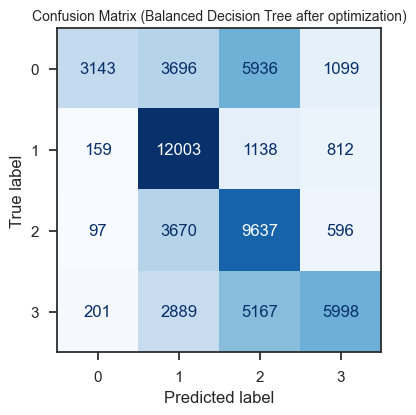

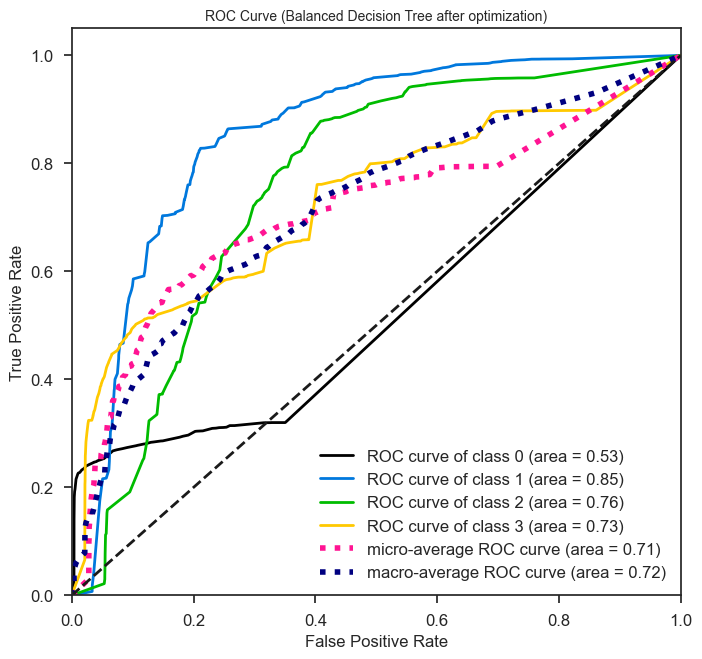

In [144]:
#Evaluation of the optimized Decision Tree on balanced Data
tree_balanced_opt = tree_balanced_gs.best_estimator_
y_pred_tree_bal_opt = tree_balanced_opt.predict(X_test)
print(classification_report(y_test, y_pred_tree_bal_opt))
cm = confusion_matrix(y_test, y_pred_tree_bal_opt)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree_balanced_opt.classes_)
disp.plot(ax=ax, cmap='Blues', colorbar=False)

ax.set_title('Confusion Matrix (Balanced Decision Tree after optimization)', fontsize=10)
#ROC Curve
y_probas_tree_bal_opt = tree_balanced_opt.predict_proba(X_test) 
skplt.metrics.plot_roc(y_test, y_probas_tree_bal_opt, figsize=(7, 7))  # reduced size
plt.title('ROC Curve (Balanced Decision Tree after optimization)', fontsize=10)



(0.0, 1.0)

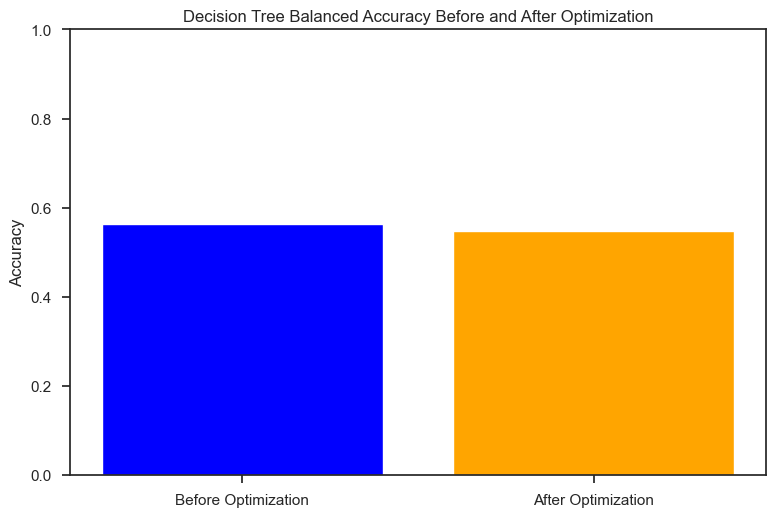

In [145]:
#compare decision tree balanced before and after optimization
# bar chart for decision tree balanced before and after optimization
import matplotlib.pyplot as plt
labels = ['Before Optimization', 'After Optimization']  
before_opt = accuracy_score(y_test, y_pred_tree_bal)
after_opt = accuracy_score(y_test, y_pred_tree_bal_opt)
# Bar chart
plt.bar(labels, [before_opt, after_opt], color=['blue', 'orange'])
plt.ylabel('Accuracy')
plt.title('Decision Tree Balanced Accuracy Before and After Optimization')
plt.ylim(0, 1)

### *Naive Gaussian* - balanced

In [146]:
#Gaussian Naive Bayes on balanced Data
gnb_balanced = GaussianNB()
gnb_balanced.fit(X_train, y_train)
y_pred_gnb_bal = gnb_balanced.predict(X_test)


In [147]:
gnb_balanced.fit(X_train, y_train)

GaussianNB()

              precision    recall  f1-score   support

           0       0.61      0.22      0.32     13874
           1       0.39      0.58      0.46     14112
           2       0.41      0.56      0.47     14000
           3       0.58      0.44      0.50     14255

    accuracy                           0.45     56241
   macro avg       0.50      0.45      0.44     56241
weighted avg       0.50      0.45      0.44     56241



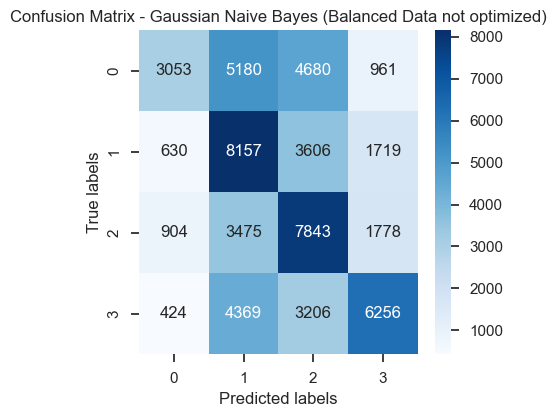

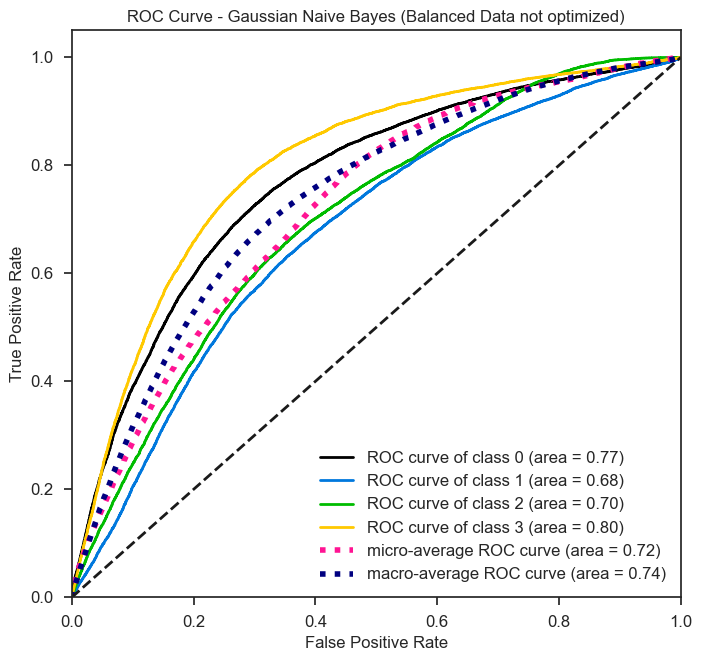

In [148]:
#evaluation of Gaussian Naive Bayes on Unbalanced Data not optimized
print(classification_report(y_test, y_pred_gnb_bal))
cm = confusion_matrix(y_test, y_pred_gnb_bal)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix - Gaussian Naive Bayes (Balanced Data not optimized)')
plt.show()  
#ROC Curve
y_probas_gnb_bal = gnb_balanced.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, y_probas_gnb_bal, figsize=(7, 7))  # reduced size
plt.title('ROC Curve - Gaussian Naive Bayes (Balanced Data not optimized)')
plt.show()

In [150]:
#optimize Gaussian Naive Bayes on balanced Data using GridSearchCV
param_grid = {
    'var_smoothing': np.logspace(0, -9, num=100)
}   
gnb_balanced_gs = GridSearchCV(GaussianNB(), param_grid, cv=5)
gnb_balanced_gs.fit(X_train, y_train)
print("Best parameters (Balanced Gaussian Naive Bayes after optimization):", gnb_balanced_gs.best_params_)
print("Best cross-validation score (Balanced Gaussian Naive Bayes after optimization):", gnb_balanced_gs.best_score_)


Best parameters (Balanced Gaussian Naive Bayes after optimization): {'var_smoothing': 0.01519911082952933}
Best cross-validation score (Balanced Gaussian Naive Bayes after optimization): 0.4546854364308725


              precision    recall  f1-score   support

           0       0.60      0.27      0.37     13874
           1       0.39      0.58      0.47     14112
           2       0.41      0.54      0.46     14000
           3       0.59      0.44      0.50     14255

    accuracy                           0.46     56241
   macro avg       0.50      0.46      0.45     56241
weighted avg       0.50      0.46      0.45     56241



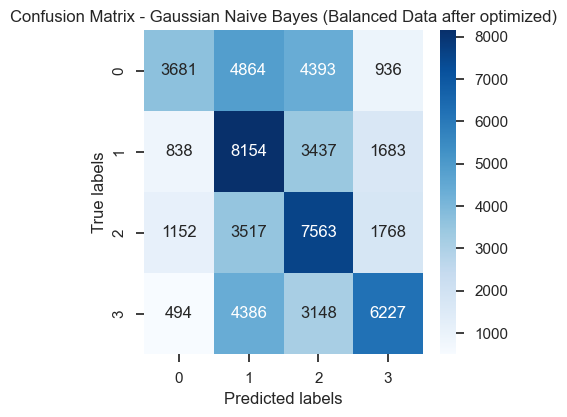

Text(0.5, 1.0, 'ROC Curve - Gaussian Naive Bayes (Balanced Data after optimized)')

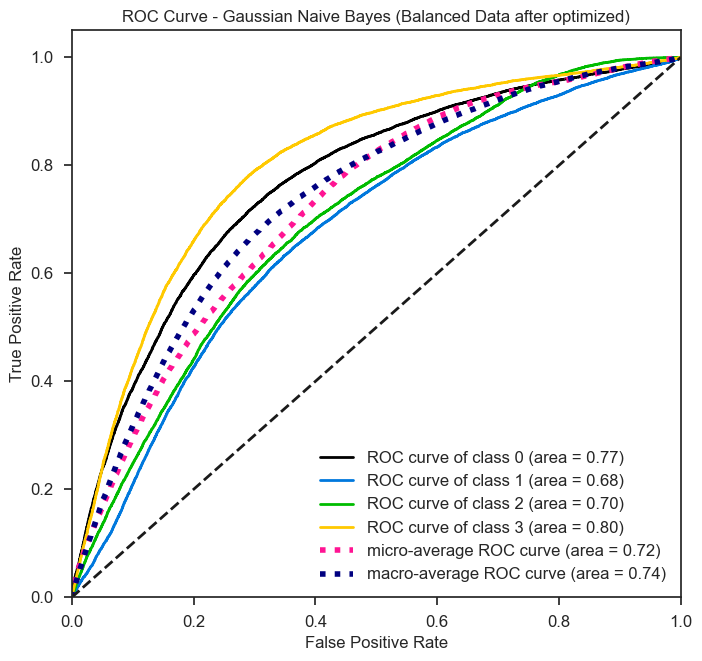

In [151]:
#Evaluate the optimized gaussian Naive Bayes model on balanced Data
gnb_balanced_opt = gnb_balanced_gs.best_estimator_
y_pred_gnb_bal_opt = gnb_balanced_opt.predict(X_test)
# classification report for balanced data after optimization
print(classification_report(y_test, y_pred_gnb_bal_opt))
cm = confusion_matrix(y_test, y_pred_gnb_bal_opt)
# Smaller confusion matrix plot
fig, ax = plt.subplots(figsize=(4, 4))  # reduced size
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix - Gaussian Naive Bayes (Balanced Data after optimized)')
plt.show()

#ROC Curve
y_probas_gnb_bal_opt = gnb_balanced_opt.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, y_probas_gnb_bal_opt, figsize
=(7, 7))  # reduced size
plt.title('ROC Curve - Gaussian Naive Bayes (Balanced Data after optimized)') 

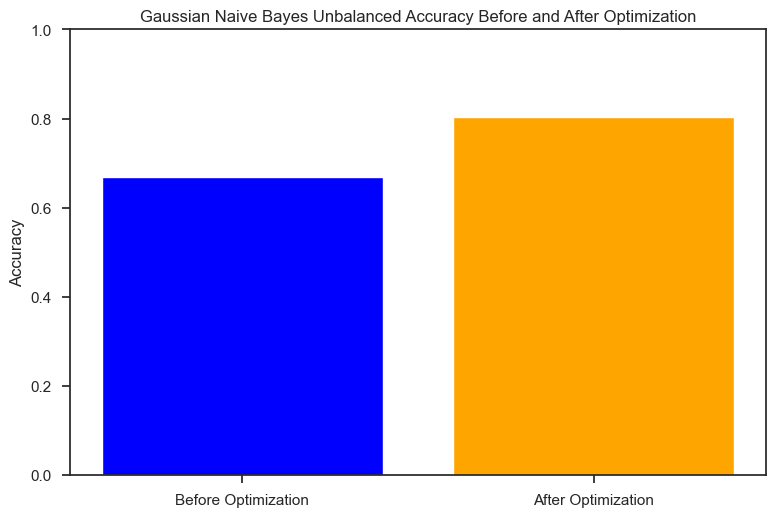

In [152]:
#compare gaussian naive bayes unbalanced before and after optimization
# bar chart for gaussian naive bayes unbalanced before and after optimization
import matplotlib.pyplot as plt
labels = ['Before Optimization', 'After Optimization']
before_opt = accuracy_score(y_test_un, y_pred_gnb_un)
after_opt = accuracy_score(y_test_un, y_pred_gnb_un_opt)
# Bar chart
plt.bar(labels, [before_opt, after_opt], color=['blue', 'orange'])
plt.ylabel('Accuracy')
plt.title('Gaussian Naive Bayes Unbalanced Accuracy Before and After Optimization')
plt.ylim(0, 1)
plt.show()

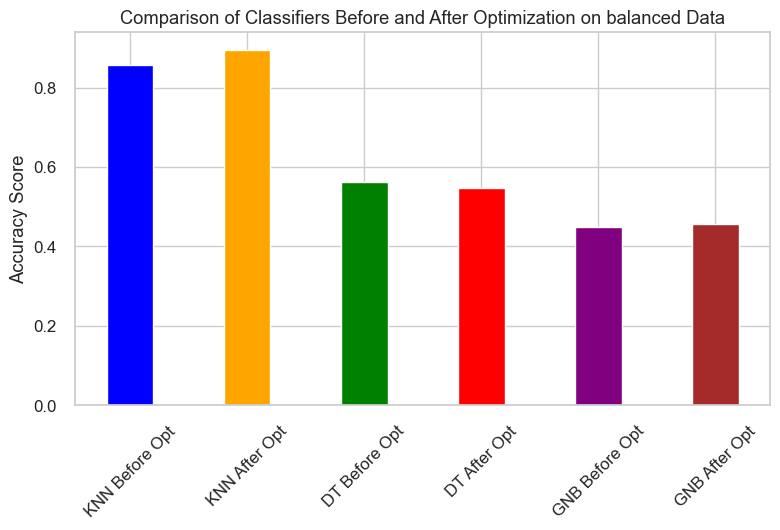

KNN Before Optimization Accuracy: 0.8582706566383955
KNN After Optimization Accuracy: 0.8957522092423676
Decision Tree Before Optimization Accuracy: 0.562578901513131
Decision Tree After Optimization Accuracy: 0.547305346633239
Gaussian Naive Bayes Before Optimization Accuracy: 0.45000977934247255
Gaussian Naive Bayes After Optimization Accuracy: 0.4556284561085329


In [158]:
#comparision of KNN, Decision Tree and Gaussian Naive Bayes on balanced data before and after optimization using cohen kappa score
import matplotlib.pyplot as plt
labels = ['KNN Before Opt', 'KNN After Opt', 'DT Before Opt', 'DT After Opt', 'GNB Before Opt', 'GNB After Opt']
knn_before_opt = accuracy_score(y_test, y_pred_bal)    
knn_after_opt = accuracy_score(y_test, y_pred_bal_opt)
dt_before_opt = accuracy_score(y_test, y_pred_tree_bal)
dt_after_opt = accuracy_score(y_test, y_pred_tree_bal_opt)
gnb_before_opt = accuracy_score(y_test, y_pred_gnb_bal)
gnb_after_opt = accuracy_score(y_test, y_pred_gnb_bal_opt)
# Bar chart
plt.bar(labels, [knn_before_opt, knn_after_opt, dt_before_opt, dt_after_opt, gnb_before_opt, gnb_after_opt], color=['blue', 'orange', 'green', 'red', 'purple', 'brown'], width=0.4)
plt.ylabel('Accuracy Score')
plt.title('Comparison of Classifiers Before and After Optimization on balanced Data')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#output numerical values of accuracy for KNN, Decision Tree and Gaussian Naive Bayes on unbalanced data before and after optimization
print("KNN Before Optimization Accuracy:", accuracy_score(y_test, y_pred_bal))
print("KNN After Optimization Accuracy:", accuracy_score(y_test, y_pred_bal_opt))
print("Decision Tree Before Optimization Accuracy:", accuracy_score(y_test, y_pred_tree_bal))
print("Decision Tree After Optimization Accuracy:", accuracy_score(y_test, y_pred_tree_bal_opt))
print("Gaussian Naive Bayes Before Optimization Accuracy:", accuracy_score(y_test, y_pred_gnb_bal))
print("Gaussian Naive Bayes After Optimization Accuracy:", accuracy_score(y_test, y_pred_gnb_bal_opt))


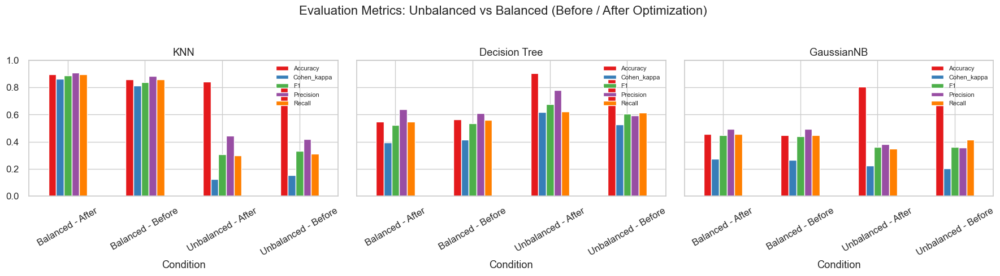

In [164]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
import pandas as pd
import matplotlib.pyplot as plt

# Comparison plot: unbalanced vs balanced evaluation metrics for KNN, Decision Tree, GaussianNB
# Uses existing variables in the notebook (y_test_un, y_test, and prediction arrays)

def eval_metrics(y_true, y_pred):
    return {
        "Accuracy": accuracy_score(y_true, y_pred),
        "Precision": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "Recall": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "F1": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "Cohen_kappa": cohen_kappa_score(y_true, y_pred)
    }

# Prepare rows for each algorithm and condition
rows = []

# KNN
rows.append(("KNN", "Unbalanced - Before", eval_metrics(y_test_un, y_pred_un)))
rows.append(("KNN", "Unbalanced - After",  eval_metrics(y_test_un, y_pred_un_opt)))
rows.append(("KNN", "Balanced - Before",   eval_metrics(y_test,    y_pred_bal)))
rows.append(("KNN", "Balanced - After",    eval_metrics(y_test,    y_pred_bal_opt)))

# Decision Tree
rows.append(("Decision Tree", "Unbalanced - Before", eval_metrics(y_test_un, y_pred_tree_un)))
rows.append(("Decision Tree", "Unbalanced - After",  eval_metrics(y_test_un, y_pred_tree_un_opt)))
rows.append(("Decision Tree", "Balanced - Before",   eval_metrics(y_test,    y_pred_tree_bal)))
rows.append(("Decision Tree", "Balanced - After",    eval_metrics(y_test,    y_pred_tree_bal_opt)))

# Gaussian Naive Bayes
rows.append(("GaussianNB", "Unbalanced - Before", eval_metrics(y_test_un, y_pred_gnb_un)))
rows.append(("GaussianNB", "Unbalanced - After",  eval_metrics(y_test_un, y_pred_gnb_un_opt)))
rows.append(("GaussianNB", "Balanced - Before",   eval_metrics(y_test,    y_pred_gnb_bal)))
rows.append(("GaussianNB", "Balanced - After",    eval_metrics(y_test,    y_pred_gnb_bal_opt)))

# Build a tidy DataFrame for plotting
plot_df = []
for alg, cond, metrics in rows:
    for mname, mval in metrics.items():
        plot_df.append({"Algorithm": alg, "Condition": cond, "Metric": mname, "Value": mval})

plot_df = pd.DataFrame(plot_df)

# Pivot and plot: one subplot per algorithm, show comparison of conditions across metrics
algorithms = plot_df['Algorithm'].unique()
n_alg = len(algorithms)
fig, axes = plt.subplots(1, n_alg, figsize=(6 * n_alg, 5), sharey=True)

# if only one algorithm, axes is not an array
if n_alg == 1:
    axes = [axes]

for ax, alg in zip(axes, algorithms):
    df_alg = plot_df[plot_df['Algorithm'] == alg]
    # use the actual column name 'Condition' as the pivot index
    pivot = df_alg.pivot(index='Condition', columns='Metric', values='Value')
    pivot.plot(kind='bar', ax=ax)
    ax.set_title(alg)
    ax.set_ylim(0, 1)
    ax.legend(loc='upper right', fontsize=8)
    ax.tick_params(axis='x', labelrotation=30)

plt.suptitle("Evaluation Metrics: Unbalanced vs Balanced (Before / After Optimization)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [165]:
# performance table sorted by Accuracy (highest -> lowest)
models = [
    ("KNN", "Unbalanced - Before", y_test_un, y_pred_un),
    ("KNN", "Unbalanced - After",  y_test_un, y_pred_un_opt),
    ("KNN", "Balanced - Before",   y_test,    y_pred_bal),
    ("KNN", "Balanced - After",    y_test,    y_pred_bal_opt),
    ("Decision Tree", "Unbalanced - Before", y_test_un, y_pred_tree_un),
    ("Decision Tree", "Unbalanced - After",  y_test_un, y_pred_tree_un_opt),
    ("Decision Tree", "Balanced - Before",   y_test,    y_pred_tree_bal),
    ("Decision Tree", "Balanced - After",    y_test,    y_pred_tree_bal_opt),
    ("GaussianNB", "Unbalanced - Before", y_test_un, y_pred_gnb_un),
    ("GaussianNB", "Unbalanced - After",  y_test_un, y_pred_gnb_un_opt),
    ("GaussianNB", "Balanced - Before",   y_test,    y_pred_gnb_bal),
    ("GaussianNB", "Balanced - After",    y_test,    y_pred_gnb_bal_opt),
]

rows = []
for alg, cond, y_true, y_pred in models:
    rows.append({
        "Algorithm": alg,
        "Condition": cond,
        "Accuracy": accuracy_score(y_true, y_pred),
        "Precision": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "Recall": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "F1": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "Cohen_kappa": cohen_kappa_score(y_true, y_pred)
    })

perf_df = pd.DataFrame(rows)
perf_df = perf_df.sort_values(by="Accuracy", ascending=False).reset_index(drop=True)
perf_df.index = perf_df.index + 1
perf_df.index.name = "Rank"

# Display the ranked table
perf_df

,Algorithm,Condition,Accuracy,Precision,Recall,F1,Cohen_kappa
Rank,,,,,,,
1,Decision Tree,Unbalanced - After,0.902603,0.778652,0.622858,0.676057,0.618011
2,KNN,Balanced - After,0.895752,0.909953,0.894406,0.886075,0.860927
3,KNN,Balanced - Before,0.858271,0.883121,0.856410,0.836874,0.810886
4,Decision Tree,Unbalanced - Before,0.858153,0.595116,0.613935,0.604200,0.525365
5,KNN,Unbalanced - After,0.842524,0.444690,0.299104,0.309282,0.124730
6,KNN,Unbalanced - Before,0.829035,0.419581,0.313745,0.331475,0.155557
7,GaussianNB,Unbalanced - After,0.804374,0.381495,0.350831,0.361548,0.226418
8,GaussianNB,Unbalanced - Before,0.669182,0.357688,0.413722,0.363503,0.202101
9,Decision Tree,Balanced - Before,0.562579,0.610228,0.561527,0.535758,0.416420


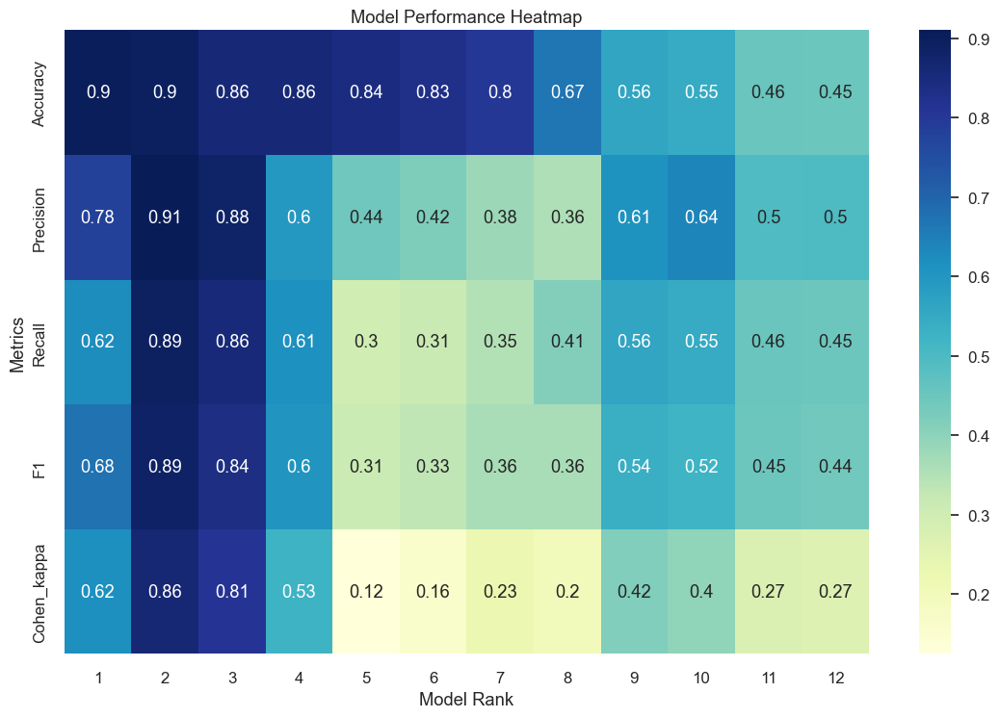

In [168]:
#visualize the performance table as a heatmap
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric metrics (exclude Algorithm/Condition) and transpose so metrics are rows
numeric_perf = perf_df.select_dtypes(include=['number'])
heatmap_data = numeric_perf.T

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", cbar=True)
plt.title("Model Performance Heatmap")
plt.xlabel("Model Rank")
plt.ylabel("Metrics")
plt.show()

## Conclusion - Result Discussion
By this summarized evaluation, we can clearly see that the highest accuracy was found at Decision Tree applied to an unbalanced dataset after optimization. Followed by Balanced KNN models before and after optimization. 

The Naive Gaussian has shown to not be a good choice for our dataset. 

- Best Performance Used the following parameters:
    1. Decision Tree (Unbalanced, After optimization) => Accuracy: 90.26% ; Entropy, max depth=10, Min leaf=4, min split=5
    2. KNN (Balanced, After optimization) => Accuracy: 89.58% ; k=2
    3. KNN (Balanced, before optimization) => Accuracy: 85.82%; k=3
- Worst Performance: Gaussian NB (Balanced, before optimization) => Accuracy: 45%
                                                    

#### To summarize my approach:
1. Explore the dataset with visualization.
2. Implement feature selection and removal of collinearity
3. Standardize and Apply PCA to both unbalanced and balanced dataset (balanced by SMOTE upsampling) using autoviz
4. Implement the Training models (KNN, Decision Tree, Naive Gaussian) to Balanced & Unbalanced datasets
5. Extract their performance (Classification report, Confusion matrix, ROC curve) & compare both balanced and unbalanced
6. Parameter Optimization using GridSearchCV to find best parameters for each model
7. Extract their performance and compare again (same as step 5)
8. Finally compare all metrics obtain to find the best results stage.